#Librerías

In [ ]:
!pip install pycaret

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.4/60.4 kB 4.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 165.8/165.8 kB 8.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 486.1/486.1 kB 23.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.8/106.8 kB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.8/21.8 MB 41.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.0/82.0 kB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.2/302.2 kB 14.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 22.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.3/12.3 MB 34.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.7/80.7 kB 1.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 42.5 MB/s eta 0:00:00
   ━━━━

In [ ]:
!pip install --quiet optuna
!pip install --quiet shap
import shap
import pandas as pd
import numpy as np
import seaborn as sns
sns.set_theme(style = 'dark', palette='Spectral')
import matplotlib.pyplot as plt
import random
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.metrics import confusion_matrix, f1_score, accuracy_score, classification_report, roc_curve, roc_auc_score, auc
import scipy.stats as stats
import warnings
warnings.filterwarnings('ignore')
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
import optuna
from pycaret.classification import *
import tensorflow as tf
from tensorflow.keras.regularizers import l2

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 364.4/364.4 kB 9.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.5/233.5 kB 13.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 4.4 MB/s eta 0:00:00


#Parte Uno

##Descarga del dataset

In [ ]:
!gdown 1j1ic5wuePzr5iD5IWEYStsVDVaYg154P
clima = pd.read_csv("weatherAUS.csv", delimiter = ",")

Downloading...
From: https://drive.google.com/uc?id=1j1ic5wuePzr5iD5IWEYStsVDVaYg154P
To: /content/weatherAUS.csv
100% 14.1M/14.1M [00:00<00:00, 45.9MB/s]


In [ ]:
clima.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


##Análisis Exploratorio

Antes de explorar el dataset vamos a filtrarlo para quedarnos con el definitivo: el que usaremos en todo el trabajo práctico al elegir 10 ciudades aleatorias y descartar el resto de los datos.

In [ ]:
clima['Location'].unique(), clima['Location'].unique().size

(array(['Albury', 'BadgerysCreek', 'Cobar', 'CoffsHarbour', 'Moree',
        'Newcastle', 'NorahHead', 'NorfolkIsland', 'Penrith', 'Richmond',
        'Sydney', 'SydneyAirport', 'WaggaWagga', 'Williamtown',
        'Wollongong', 'Canberra', 'Tuggeranong', 'MountGinini', 'Ballarat',
        'Bendigo', 'Sale', 'MelbourneAirport', 'Melbourne', 'Mildura',
        'Nhil', 'Portland', 'Watsonia', 'Dartmoor', 'Brisbane', 'Cairns',
        'GoldCoast', 'Townsville', 'Adelaide', 'MountGambier', 'Nuriootpa',
        'Woomera', 'Albany', 'Witchcliffe', 'PearceRAAF', 'PerthAirport',
        'Perth', 'SalmonGums', 'Walpole', 'Hobart', 'Launceston',
        'AliceSprings', 'Darwin', 'Katherine', 'Uluru'], dtype=object),
 49)

De las 49 ciudades de Australia, filtramos:

In [ ]:
ciudades = random.sample(list(clima['Location'].unique()), 10)
ciudades

['Canberra',
 'Townsville',
 'Cairns',
 'Hobart',
 'NorahHead',
 'Wollongong',
 'Darwin',
 'Perth',
 'Brisbane',
 'Sale']

In [ ]:
ciudades = ['Penrith',
 'PearceRAAF',
 'Melbourne',
 'Portland',
 'Newcastle',
 'Brisbane',
 'Nhil',
 'Ballarat',
 'Mildura',
 'Sydney'] #para guardar la elección y que no varíe el sample en cada ejecución
clima = clima[clima['Location'].isin(ciudades)] #dataset definitivo

In [ ]:
clima.reset_index(drop=True, inplace=True)

In [ ]:
clima

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Newcastle,13.2,NaN,0.0,NaN,NaN,NaN,NaN,NW,...,50.0,24.0,NaN,NaN,3.0,4.0,21.8,30.6,No,No
1,2008-12-02,Newcastle,NaN,32.2,0.0,NaN,NaN,NaN,NaN,NaN,...,NaN,59.0,NaN,NaN,NaN,0.0,NaN,25.4,No,No
2,2008-12-03,Newcastle,16.2,32.2,0.0,NaN,NaN,NaN,NaN,N,...,74.0,26.0,NaN,NaN,4.0,4.0,22.2,32.0,No,No
3,2008-12-04,Newcastle,19.2,24.0,0.0,NaN,NaN,NaN,NaN,SE,...,66.0,61.0,NaN,NaN,7.0,5.0,20.4,23.0,No,No
4,2008-12-05,Newcastle,18.8,30.2,0.0,NaN,NaN,NaN,NaN,NE,...,85.0,NaN,NaN,NaN,8.0,NaN,20.0,NaN,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29448,2017-06-21,PearceRAAF,NaN,20.6,NaN,NaN,7.5,NW,43.0,N,...,77.0,50.0,1017.4,1014.0,1.0,1.0,15.6,19.0,NaN,Yes
29449,2017-06-22,PearceRAAF,13.0,18.8,28.8,NaN,0.0,NNE,54.0,NW,...,88.0,74.0,1007.4,1009.4,8.0,8.0,16.5,17.9,Yes,Yes
29450,2017-06-23,PearceRAAF,13.0,19.3,1.4,NaN,6.5,ESE,50.0,E,...,78.0,69.0,1018.4,1019.0,8.0,8.0,15.9,18.0,Yes,No
29451,2017-06-24,PearceRAAF,11.6,18.2,0.0,NaN,9.3,E,48.0,SE,...,69.0,55.0,1025.6,1023.2,NaN,2.0,13.7,16.4,No,No



*   'RainTomorrow' es la variable target y el resto son features


###**Split de datos**

In [ ]:
#Vamos a separar entre la matriz de features y la target
X = clima.drop('RainTomorrow', axis=1)
y = clima['RainTomorrow'].values.reshape(-1,1)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Convertimos y_train a un DataFrame para poder combinarlo con X_train temporalmente para realizar visualizaciones gráficas
# También queremos a y_test como Dataframe
y_train_df = pd.DataFrame(y_train, columns=['RainTomorrow'])
y_test_df = pd.DataFrame(y_test, columns=['RainTomorrow'])

In [ ]:
#Guardamos los datos así como están para usarlos en el futuro en Docker
X_train.to_csv("X_train.csv", index=False)
y_train_df.to_csv("y_train.csv", index=False)

# Guardar los datos de prueba
X_test.to_csv("X_test.csv", index=False)
y_test_df.to_csv("y_test.csv", index=False)

In [ ]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((23562, 22), (5891, 22), (23562, 1), (5891, 1))

In [ ]:
#Hacemos un reset del indice de X_train para que se correlacione con el indice de y_train_df
X_train.reset_index(drop=True, inplace=True)

In [ ]:
# Concatenamos X_train_scaled con y_train_df
clima_train = pd.concat([X_train, y_train_df], axis=1)

In [ ]:
print(clima_train.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23562 entries, 0 to 23561
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           23562 non-null  object 
 1   Location       23562 non-null  object 
 2   MinTemp        22883 non-null  float64
 3   MaxTemp        22965 non-null  float64
 4   Rainfall       22618 non-null  float64
 5   Evaporation    12026 non-null  float64
 6   Sunshine       14428 non-null  float64
 7   WindGustDir    19996 non-null  object 
 8   WindGustSpeed  19996 non-null  float64
 9   WindDir9am     21518 non-null  object 
 10  WindDir3pm     22335 non-null  object 
 11  WindSpeed9am   23274 non-null  float64
 12  WindSpeed3pm   22733 non-null  float64
 13  Humidity9am    22861 non-null  float64
 14  Humidity3pm    22344 non-null  float64
 15  Pressure9am    18231 non-null  float64
 16  Pressure3pm    18214 non-null  float64
 17  Cloud9am       16702 non-null  float64
 18  Cloud3



*   **Estructura del dataset de train: 23 columnas x 23.562 filas**
*   16 variables tipo float y 7 tipo object




In [ ]:
print(clima_train.describe())

            MinTemp       MaxTemp      Rainfall   Evaporation      Sunshine  \
count  22883.000000  22965.000000  22618.000000  12026.000000  14428.000000   
mean      12.010694     22.908308      2.247652      4.948586      7.572761   
std        5.562834      6.727413      7.790778      3.180217      3.813208   
min       -5.600000      4.600000      0.000000      0.000000      0.000000   
25%        7.900000     17.900000      0.000000      2.400000      4.800000   
50%       11.700000     22.400000      0.000000      4.400000      8.400000   
75%       16.200000     27.500000      0.800000      7.000000     10.500000   
max       31.900000     46.900000    240.000000     44.000000     14.500000   

       WindGustSpeed  WindSpeed9am  WindSpeed3pm   Humidity9am   Humidity3pm  \
count   19996.000000  23274.000000  22733.000000  22861.000000  22344.000000   
mean       39.473845     13.552376     17.688690     70.662788     51.653643   
std        14.447493      9.543273      9.420061

Se ve que cada variable real está dentro de un rango coherente (las relacionadas a temperaturas oscilan entre valores negativos y positivos ✔, las relacionadas a nubosidad, lluvias, presión, humedad, velocidad del viento, luz solar y evaporación no tienen valores negativos ✔)


In [ ]:
clima_train_variables = pd.DataFrame([('Date','Fecha de las observaciones','object',(clima_train['Date'].min(), clima_train['Date'].max())),
 ('Location','Ciudad de australia','object', ciudades),
 ('MinTemp','Temperatura mínima en °C','float',(clima_train['MinTemp'].min(), clima_train['MinTemp'].max())),
 ('MaxTemp','Temperatura máxima °C','float',(clima_train['MaxTemp'].min(), clima_train['MaxTemp'].max())),
 ('Rainfall','Precipitación en mm','float',(clima_train['Rainfall'].min(), clima_train['Rainfall'].max())),
 ('Evaporation','Evaporación en mm','float',(clima_train['Evaporation'].min(), clima_train['Evaporation'].max())),
 ('Sunshine','Horas de luz solar por día','float',(clima_train['Sunshine'].min(), clima_train['Sunshine'].max())),
 ('WindGustDir','Dirección de ráfagas de viento en km/h','object',list(clima_train['WindGustDir'].unique())),
 ('WindGustSpeed','Velocidad de ráfagas de viento','float',(clima_train['WindGustSpeed'].min(), clima_train['WindGustSpeed'].max())),
 ('WindDir9am','Dirección del viento a las 9 am','object',list(clima_train['WindDir9am'].unique())),
 ('WindDir3pm','Dirección del viento a las 3 pm','object',list(clima_train['WindDir3pm'].unique())),
 ('WindSpeed9am','Velocidad del viento a las 9 am en km/h','float',(clima_train['WindSpeed9am'].min(), clima_train['WindSpeed9am'].max())),
 ('WindSpeed3pm','Velocidad del viento a las 3 pm en km/h','float',(clima_train['WindSpeed3pm'].min(), clima_train['WindSpeed3pm'].max())),
 ('Humidity9am','% de humedad a las 9 am','float',(clima_train['Humidity9am'].min(), clima_train['Humidity9am'].max())),
 ('Humidity3pm','% de humedad a las 3 pm','float',(clima_train['Humidity3pm'].min(), clima_train['Humidity3pm'].max())),
 ('Pressure9am','Presión atmosférica a las 9 am en hpa','float',(clima_train['Pressure9am'].min(), clima_train['Pressure9am'].max())),
 ('Pressure3pm','Presión atmosférica a las 3 pm en hpa','float',(clima_train['Pressure3pm'].min(), clima_train['Pressure3pm'].max())),
 ('Cloud9am','Nubosidad a las 9 am','float',(clima_train['Cloud9am'].min(), clima_train['Cloud9am'].max())),
 ('Cloud3pm','Nubosidad a las 3 pm','float',(clima_train['Cloud3pm'].min(), clima_train['Cloud3pm'].max())),
 ('Temp9am','Temperatura a las 9 am en °C','float',(clima_train['Temp9am'].min(), clima_train['Temp9am'].max())),
 ('Temp3pm','Temperatura a las 3 pm en °C','float',(clima_train['Temp3pm'].min(), clima_train['Temp3pm'].max())),
 ('RainToday','Indica si llovió hoy','object','[Yes, No]'),
 ('RainTomorrow','Indica si hay lluvia mañana','object','[Yes, No]')],columns=('Variable','Descripción','Tipo_de_dato','Rango_o_valores'))
clima_train_variables

,Variable,Descripción,Tipo_de_dato,Rango_o_valores
0,Date,Fecha de las observaciones,object,"(2008-02-01, 2017-06-25)"
1,Location,Ciudad de australia,object,"[Penrith, PearceRAAF, Melbourne, Portland, New..."
2,MinTemp,Temperatura mínima en °C,float,"(-5.6, 31.9)"
3,MaxTemp,Temperatura máxima °C,float,"(4.6, 46.9)"
4,Rainfall,Precipitación en mm,float,"(0.0, 240.0)"
5,Evaporation,Evaporación en mm,float,"(0.0, 44.0)"
6,Sunshine,Horas de luz solar por día,float,"(0.0, 14.5)"
7,WindGustDir,Dirección de ráfagas de viento en km/h,object,"[NW, WSW, nan, N, E, SW, ENE, S, NNW, W, NNE, ..."
8,WindGustSpeed,Velocidad de ráfagas de viento,float,"(7.0, 122.0)"
9,WindDir9am,Dirección del viento a las 9 am,object,"[N, NW, nan, W, ENE, SSW, NNE, ESE, WSW, SSE, ..."


###Visualizaciones

In [ ]:
columnas_datos_object = clima_train.select_dtypes(include=['object']).columns
columnas_datos_float = clima_train.columns.difference(columnas_datos_object)

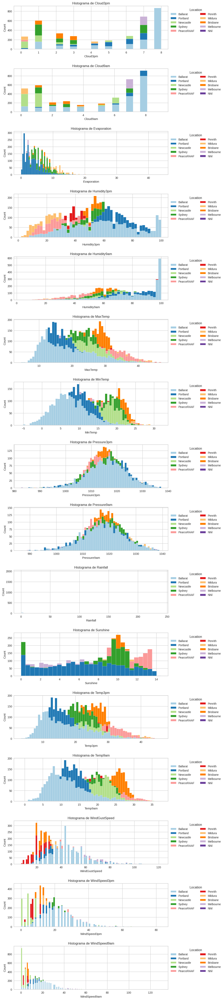

In [ ]:
#Histplots de cada columna con tipo de dato real
fig, axes = plt.subplots(nrows=len(columnas_datos_float), figsize=(10, len(columnas_datos_float)*4))

for ax, columna in zip(axes, columnas_datos_float):
    sns.histplot(data=clima_train, x=columna, hue='Location', alpha=1, palette='Paired', ax=ax)
    sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1),ncol=2)
    ax.set_title(f'Histograma de {columna}')

plt.subplots_adjust(hspace=0.45)

A priori se notan varias cosas:
- las variables referidas al viento presentan sesgo a la derecha, al igual que la evaporación
- Rainfall con gráfica muy pequeña. ¿Es por outliers?
- las variables referidas a la presión parecen tener distribución normal
- mucha varianza en variables referidas a la humedad

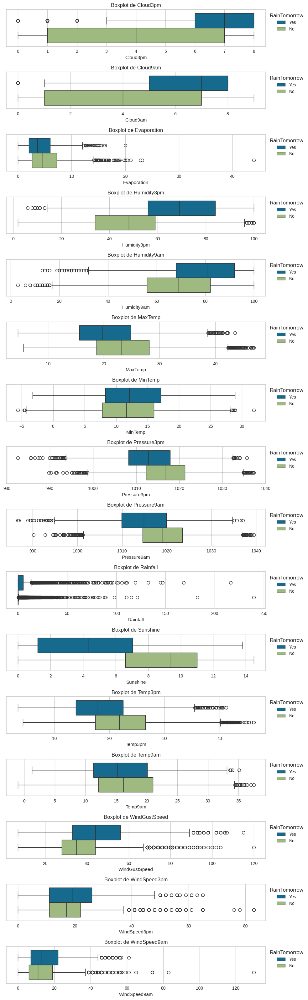

In [ ]:
#Subplots individuales para cada columna
fig, axes = plt.subplots(nrows=len(columnas_datos_float), ncols=1, figsize=(10, 2 * len(columnas_datos_float)))

# Generar un boxplot por cada columna
for i, col in enumerate(columnas_datos_float):
    sns.boxplot(data=clima_train, x=col, ax=axes[i], hue='RainTomorrow')
    sns.move_legend(axes[i], "upper left", bbox_to_anchor=(1, 1))
    axes[i].set_title(f'Boxplot de {col}')

plt.subplots_adjust(hspace=0.45)
plt.tight_layout()

En este gráfico podemos observar los boxplots de cada variable continua separandolos cuando la variable objetivo toma diferentes valores y vemos que las variables relacionadas a la nubosidad, humedad y la cantidad de horas del sol en el día son las que mas variación presentan. Esto puede indicar que tienen una relación considerable con la variable objetivo.

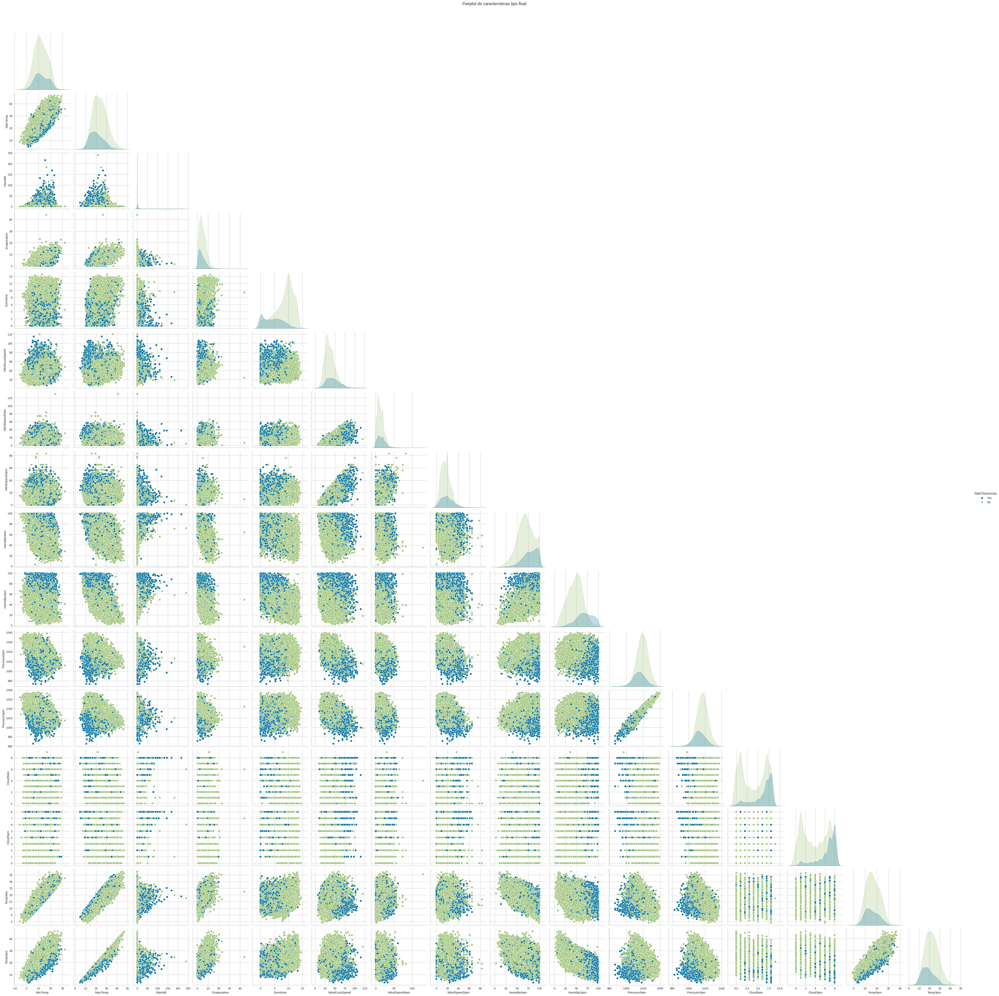

In [ ]:
sns.pairplot(data = clima_train, corner = True, height = 3, hue = 'RainTomorrow')
plt.suptitle('Pairplot de características tipo float', y=1.02)
plt.show()

Podemos notar varias cosas:
- Marcadas relaciones lineales entre las variables que tienen que ver con temperatura
- Comportamiendo bimodal de las features de nubosidad
- Desbalance del dataset con predominancia de los 'No' en RainTomorrow. Vemos:

In [ ]:
#Calculo proporciones en la target
round((clima_train['RainTomorrow'].value_counts(normalize=True))*100,2)

,proportion
RainTomorrow,
No,76.87
Yes,23.13


 **La diferencia entre frecuencias de la variable target nos indica desbalanceo.**  
  Esto es importante saberlo para la determinación de la métrica de medición del modelo de Regresión Logística que haremos más adelante, ya que, es normal que en los modelos desbalanceados se genere una tendencia en las predicciones hacia la variable mayoritaria: 'No' está representada más de tres veces en comparación a 'Yes' haciendo que el modelo pueda terminar aprendiendo a predecir predominantemente cuando no llueve que cuando sí lo hace.

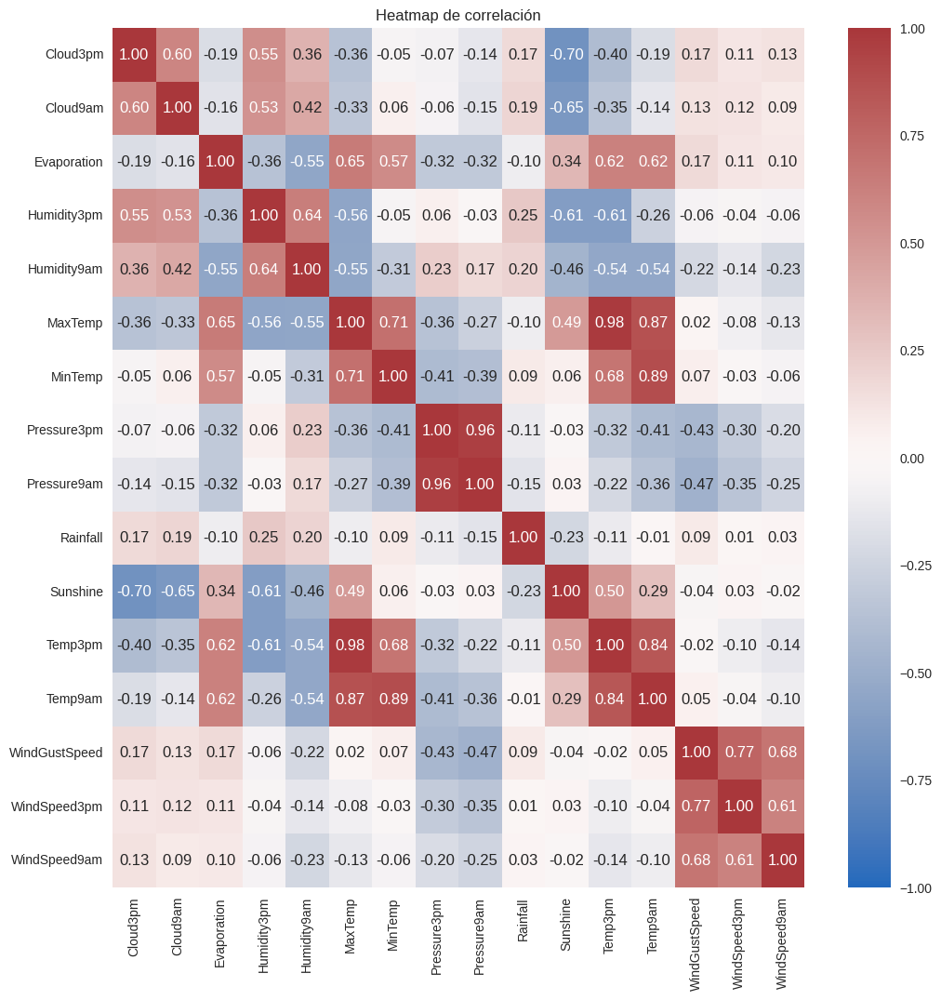

In [ ]:
#Matriz de correlación
corr = clima_train[columnas_datos_float].corr().round(2)
plt.figure(figsize=(12, 12))
sns.heatmap(corr, annot=True, cmap="vlag", fmt='.2f', vmin=-1, vmax=1)
plt.title('Heatmap de correlación')
plt.show()

Como dijimos se nota la relación lineal fuerte entre las features de temperatura (las máximas y mínimas y las que adoptan a las 9 am o 3 pm). Queremos volver a realizar este gráfico una vez codifiquemos las variables categóricas

##Manejo de valores NaN

In [ ]:
clima_train.isna().sum()

,0
Date,0
Location,0
MinTemp,679
MaxTemp,597
Rainfall,944
Evaporation,11536
Sunshine,9134
WindGustDir,3566
WindGustSpeed,3566
WindDir9am,2044


In [ ]:
#Borramos todos los valores NaN que estén en la target
clima_train.dropna(subset=['RainTomorrow'],inplace=True)

In [ ]:
clima_train.isna().sum()

,0
Date,0
Location,0
MinTemp,264
MaxTemp,154
Rainfall,315
Evaporation,11189
Sunshine,8984
WindGustDir,3376
WindGustSpeed,3376
WindDir9am,1950


In [ ]:
clima_train.shape

(22607, 23)

Habían 23.562 registros y ahora quedan 22.607, así que ya borramos el 4,05% de los datos (955 registros). De hecho, si como máximo estamos dispuestos a perder el 5% de los datos, son 1178 registros aprox. los que podríamos prescindir. Es decir, si seguimos evaluando los NaN, como mucho nos vamos a limitar a borrar unas 223 filas más.

In [ ]:
clima_train[clima_train.isnull().any(axis=1)].shape #cuántos registros tienen algún valor nan

(13865, 23)

In [ ]:
filas_nan = clima_train.isnull().sum(axis=1).value_counts().rename_axis('Cantidad de NaN').rename('Cantidad de filas').sort_index()
filas_nan

,Cantidad de filas
Cantidad de NaN,
0,8742
1,1971
2,3617
3,1492
4,1796
5,134
6,2703
7,1045
8,287


In [ ]:
#conteo de filas que tienen 13 valores nulos o más
filas_nan[13:].sum()

152

152 es menor que nuestro limite de 223 así que procedemos a borrar los registros con 13 valores NaN o más. El resto los vamos a imputar

In [ ]:
#Borramos los registros que contengan 13 valores NaN o más
clima_train.dropna(thresh=len(clima.columns)-12, inplace = True)

##Input de Datos

###Imputación variables continuas

  Para las variables continuas vamos a usar diferentes imputadores para completar los valores faltantes de las columnas. Para las que tengan una distribucion normal o semejante useremos el SimpleImputer y para aquellos que tengan una distribucion diferente utilizaremos el knnImputer. Esto lo decidimos viendo el histograma y pairplot de cada variable hecho previamente con un analisis utilizando el metodo de Quartil-Quartil para encontrar distribuciones normales

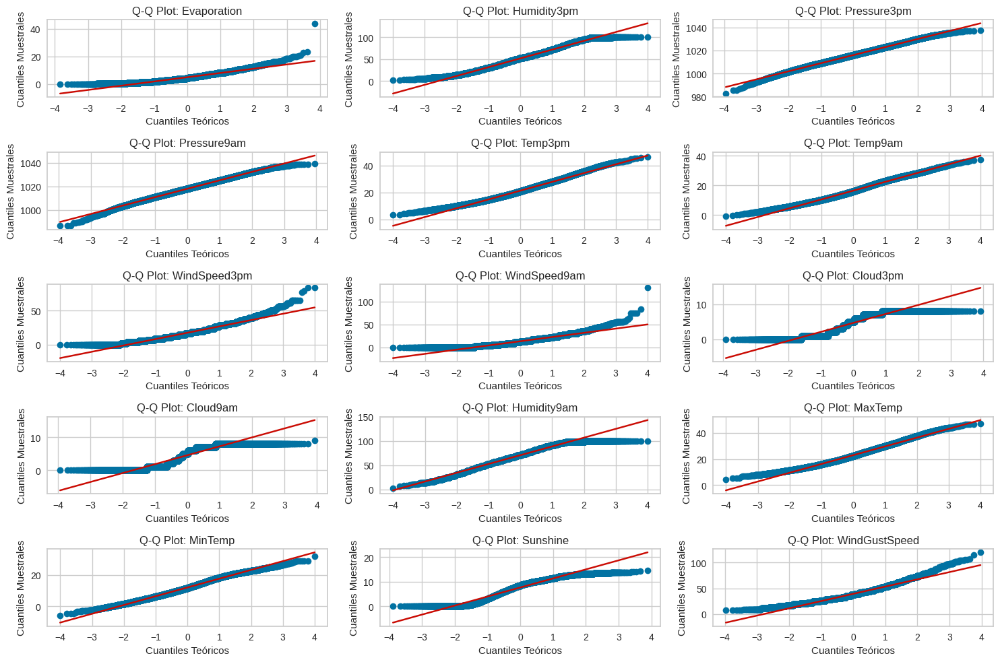

In [ ]:
#Lista de columnas a analizar
columnas = ["Evaporation","Humidity3pm","Pressure3pm","Pressure9am","Temp3pm","Temp9am","WindSpeed3pm","WindSpeed9am","Cloud3pm","Cloud9am","Humidity9am","MaxTemp","MinTemp","Sunshine","WindGustSpeed"]

plt.figure(figsize=(15, 10))
num_cols = len(columnas)

for i, columna in enumerate(columnas, 1):
    plt.subplot(5, 3, i)
    datos_sin_nan = clima_train[columna].dropna()
    stats.probplot(datos_sin_nan, dist="norm", plot=plt)
    plt.title(f"Q-Q Plot: {columna}")
    plt.xlabel("Cuantiles Teóricos")
    plt.ylabel("Cuantiles Muestrales")

plt.tight_layout()
plt.show()


Teniendo la información de estos graficos más los anteriores nombrados, concluimos que las que mejor se adaptan a una distribucion normal son: Pressure3pm, Pressure9am, Temp3pm, Temp9am, MinTemp, MaxTemp

In [ ]:
dist_normal_imputar = [
    "Pressure3pm",
    "Pressure9am",
    "Temp3pm",
    "Temp9am",
    "MinTemp",
    "MaxTemp"
]
imputer = SimpleImputer(strategy='median')
#Imputar las columnas seleccionadas tanto en el conjunto de training como en el de test
clima_train[dist_normal_imputar] = imputer.fit_transform(clima_train[dist_normal_imputar])
X_test[dist_normal_imputar] = imputer.transform(X_test[dist_normal_imputar])

El resto de las variables continuas las imputaremos con KNNImputer

In [ ]:
dist_no_norm_imputar = [
    "Evaporation",
    "Rainfall",
    "Humidity3pm",
    "WindSpeed3pm",
    "WindSpeed9am",
    "Cloud3pm",
    "Cloud9am",
    "Humidity9am",
    "Sunshine",
    "WindGustSpeed"
]
imputer = KNNImputer()

clima_train[dist_no_norm_imputar] = imputer.fit_transform(clima_train[dist_no_norm_imputar])
X_test[dist_no_norm_imputar] = imputer.transform(X_test[dist_no_norm_imputar])

###Imputación variables categóricas

####Variables Wind

In [ ]:
#Imputamos en base a un muestreo aleatorio: obtenemos valores únicos (direcciones del viento, en este caso) y las frecuencias relativas (probs) de estos valores
clima_train_wind = clima_train[["WindDir3pm","WindDir9am","WindGustDir"]]
X_test_wind = X_test[["WindDir3pm","WindDir9am","WindGustDir"]]

for col in clima_train_wind.columns:
    values = clima_train_wind[col].value_counts().index.values  #Valores únicos
    probs = clima_train_wind[col].value_counts(normalize=True).values  #Probabilidades
    clima_train_wind[col].replace(np.nan, np.random.choice(a=values, p=probs), inplace=True)
    X_test_wind[col].replace(np.nan, np.random.choice(a=values, p=probs), inplace=True)

In [ ]:
# Reemplazar las columnas en clima_train
for col in clima_train_wind.columns:
    clima_train[col] = clima_train_wind[col]

# Reemplazar las columnas en X_test
for col in X_test_wind.columns:
    X_test[col] = X_test_wind[col]

####Imput RainToday

In [ ]:
#Misma metodología que con Wind
rain_today_prob = clima_train['RainToday'].value_counts(normalize=True)

clima_train['RainToday'].replace(np.nan, np.random.choice(rain_today_prob.index, p=rain_today_prob.values), inplace=True)
X_test['RainToday'].replace(np.nan, np.random.choice(rain_today_prob.index, p=rain_today_prob.values), inplace=True)

In [ ]:
clima_train['RainToday'].replace(np.nan, np.random.choice(a=values, p=probs), inplace=True)

In [ ]:
X_test.isna().sum(), clima_train.isna().sum()

(Date             0
 Location         0
 MinTemp          0
 MaxTemp          0
 Rainfall         0
 Evaporation      0
 Sunshine         0
 WindGustDir      0
 WindGustSpeed    0
 WindDir9am       0
 WindDir3pm       0
 WindSpeed9am     0
 WindSpeed3pm     0
 Humidity9am      0
 Humidity3pm      0
 Pressure9am      0
 Pressure3pm      0
 Cloud9am         0
 Cloud3pm         0
 Temp9am          0
 Temp3pm          0
 RainToday        0
 dtype: int64,
 Date             0
 Location         0
 MinTemp          0
 MaxTemp          0
 Rainfall         0
 Evaporation      0
 Sunshine         0
 WindGustDir      0
 WindGustSpeed    0
 WindDir9am       0
 WindDir3pm       0
 WindSpeed9am     0
 WindSpeed3pm     0
 Humidity9am      0
 Humidity3pm      0
 Pressure9am      0
 Pressure3pm      0
 Cloud9am         0
 Cloud3pm         0
 Temp9am          0
 Temp3pm          0
 RainToday        0
 RainTomorrow     0
 dtype: int64)

In [ ]:
#Hasta acá guardamos los datos de train y test para usarlos luego en AutoML
clima_train_aml = clima_train
X_test_aml = X_test
y_test_aml = y_test

##Extracción variable Mes

En el dataset tenemos la variable 'Date', pero la lluvia es algo que podríamos independizar del año debido a que a lo largo de los mismos se notan periodos de mayores o menor presencias de lluvias. Queremos verificar esto con un gráfico. Nos podríamos quedar solamente con el mes?

In [ ]:
periodicidad_lluvias = clima_train.copy()
periodicidad_lluvias['month'] = periodicidad_lluvias.Date.apply(lambda x: int(str(x)[5:7]))
periodicidad_lluvias[['Date', 'month']].head()

,Date,month
0,2010-12-03,12
1,2011-01-27,1
2,2011-02-04,2
3,2016-06-30,6
4,2013-06-20,6


In [ ]:
#Convierte 'RainToday' a numérico (1 = 'Yes', 0 = 'No')
periodicidad_lluvias['RainToday'] = periodicidad_lluvias['RainToday'].map({'Yes': 1, 'No': 0})

#Ahora agrupa por mes y calcula el promedio de 'RainToday'
periodicidad_agrupada = periodicidad_lluvias[['Cloud3pm', 'Cloud9am', 'Evaporation', 'Humidity3pm', 'Humidity9am',
       'MaxTemp', 'MinTemp', 'Pressure3pm', 'Pressure9am', 'Rainfall',
       'Sunshine', 'Temp3pm', 'Temp9am', 'WindGustSpeed', 'WindSpeed3pm',
       'WindSpeed9am','RainToday','month']].groupby('month').mean() #dejamos todas las columnas menos las categóricas para agrupar x la media

periodicidad_agrupada[['RainToday']]

,RainToday
month,
1,0.163214
2,0.183922
3,0.206660
4,0.222601
5,0.229247
6,0.285714
7,0.283360
8,0.265929
9,0.248891


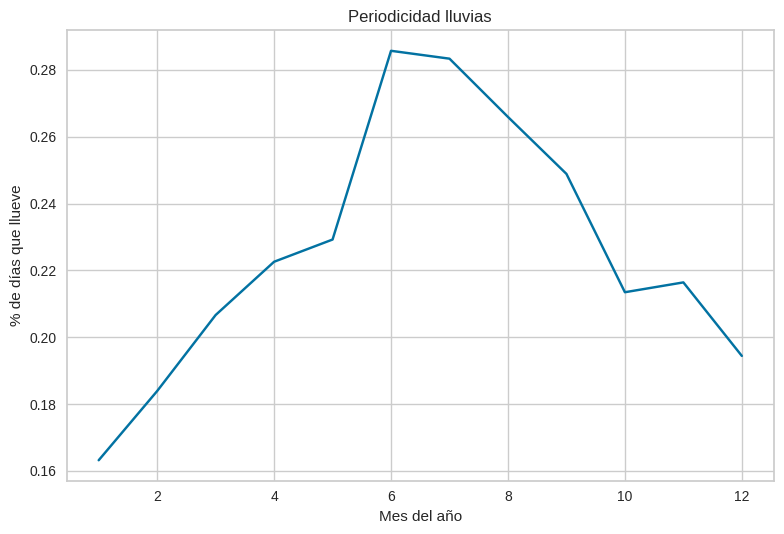

In [ ]:
sns.lineplot(data=periodicidad_agrupada, x=periodicidad_agrupada.index, y='RainToday')
plt.title('Periodicidad lluvias')
plt.xlabel('Mes del año')
plt.ylabel('% de días que llueve')
plt.tight_layout()

Se nota que sí siguen una tendencia las lluvias a lo largo de un año: van en aumento hacia el mes de julio y hasta diciembre se produce un paulatino descenso. Esto nos sustenta la idea de simplificar la variable Date quedándonos con el mes

In [ ]:
#Extraigo el mes de la columna Date
clima_train['Date'] = pd.to_datetime(clima_train['Date'])
clima_train['Month'] = clima_train['Date'].dt.month
X_test['Date'] = pd.to_datetime(X_test['Date'])
X_test['Month'] = X_test['Date'].dt.month
#Elimino la columna Date original
clima_train.drop(columns=['Date'], inplace=True)
X_test.drop(columns=['Date'], inplace=True)

##Creación variables Dummies

In [ ]:
categorical_columns = ['Location','RainTomorrow', 'RainToday', 'WindDir3pm', 'WindDir9am', 'WindGustDir']

# Aplicar get_dummies a las columnas categóricas, eliminando una categoría por cada una con drop_first=True
clima_dummies = pd.get_dummies(clima_train, columns=categorical_columns, drop_first=True)
X_test = pd.get_dummies(X_test, columns=categorical_columns.remove('RainTomorrow'), drop_first=True)

In [ ]:
#vamos a convertir todos los true y false de clima_dummies a 1 y 0:
clima_dummies = clima_dummies.replace({True: 1, False: 0})
X_test = X_test.replace({True: 1, False: 0})
y_test = np.where(y_test == 'Yes', 1, 0)

##Estandarización de datos

In [ ]:
#Volvemos a dividir clima_train
X_train = clima_dummies.drop('RainTomorrow_Yes', axis=1)
y_train = clima_dummies['RainTomorrow_Yes']
#convierto y_train en un dataframe
y_train = pd.DataFrame(y_train, columns=['RainTomorrow_Yes'])

In [ ]:
X_train.shape, y_train.shape, X_test.shape, y_test.shape

((22455, 72), (22455, 1), (5891, 72), (5891, 1))

In [ ]:
X_test = X_test[X_train.columns] #esta línea es para que las columnas queden en el mismo orden en ambos datasets

In [ ]:
#Como no tratamos los valores atípicos, vamos a escalar con RobustScaler
scaler = RobustScaler()
X_train_scaled = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns)
X_test_scaled = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns)

##Modelo Regresion Logistica

In [ ]:
model_lr = LogisticRegression(class_weight='balanced', random_state=42)

Modelo con todas las features

In [ ]:
model_lr.fit(X_train_scaled, y_train)

# Realizar predicciones en el conjunto de prueba
y_pred = model_lr.predict(X_test_scaled)
#paso a dataframe
y_pred = pd.DataFrame(y_pred, columns=['RainTomorrow_Yes'])

###Métricas

Matriz de Confusión:



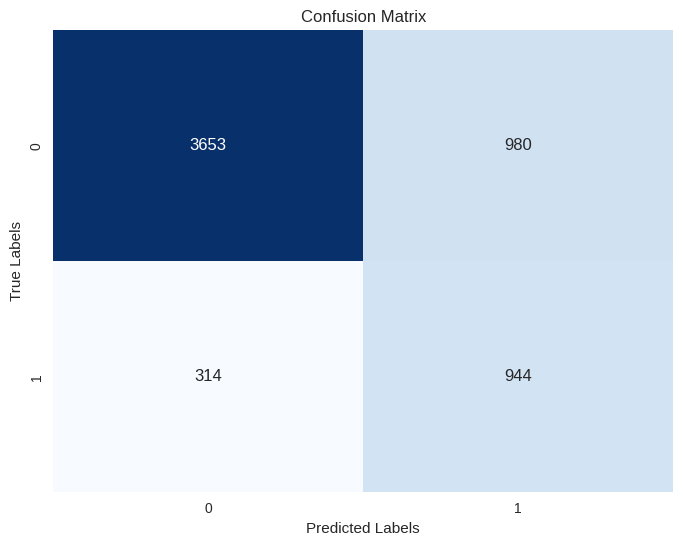


Informe de Clasificación:
               precision    recall  f1-score   support

           0       0.92      0.79      0.85      4633
           1       0.49      0.75      0.59      1258

    accuracy                           0.78      5891
   macro avg       0.71      0.77      0.72      5891
weighted avg       0.83      0.78      0.79      5891



In [ ]:
matriz_confusion = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(matriz_confusion, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
#Calcula el informe de clasificación
informe_clasificacion = classification_report(y_test, y_pred)

# Imprime las métricas
print("Matriz de Confusión:\n")
plt.show()
print("\nInforme de Clasificación:\n", informe_clasificacion)

De la matriz de confusión se puede ver que nuestro modelo tiene 1034 falsos positivos y 303 falsos negativos. Esto significa que el modelo predijo 303 veces que no llovia pero llovió. Por otra parte, el modelo predijo 1034 veces que llovía pero no llovió.

Al ser un dataset desbalanceado no vamos a tener en cuenta el accuracy porque no es una métrica adecuada.  
Si nos fijamos en el **recall** vemos que el 78% de las veces que no llueve, nuestro modelo predice que no llueve.  
En el caso de los dias que sí llueve, el modelo lo predice un 76% de las veces.  
Mirando la **precision** del modelo, observamos que cuando predecimos que no llueve, en el 92% de los casos la predicción es correcta.  
En el caso que nuestro modelo prediga que llueve, en el 48% de los casos esa prediccion es correcta.  
Teniendo en cuenta estas metricas, nuestro modelo es muy confiable a la hora de predecir los dias que no llueve, pero a la hora de predecir cuando sí llueve, las probabilidades que sea cierto son equivalentes a tirar una moneda al aire.
En conclusion el modelo es mejor para hacer predicciones sobre la clase False (que es la mayoritaria) que sobre la clase True. Esto lo esperabamos por el desbalanceo que habiamos percibido en el dataset.  


Evaluamos sobreajuste:

In [ ]:
y_train_pred = model_lr.predict(X_train_scaled)

#F1-score para los conjuntos de entrenamiento y prueba
f1_train_lr = f1_score(y_train, y_train_pred, average='weighted')
f1_test_lr = f1_score(y_test, y_pred, average='weighted')

print(f'F1-score en el conjunto de entrenamiento: {f1_train_lr:.2f}')
print(f'F1-score en el conjunto de prueba: {f1_test_lr:.2f}')

F1-score en el conjunto de entrenamiento: 0.81
F1-score en el conjunto de prueba: 0.79


La cercanía entre las métricas obtenidas para el conjunto de train y test indica buena generalización: no parece haber sobreajuste ni subajuste

###Curva ROC

In [ ]:
# Obtengo las probabilidades de predicción del modelo
y_probs = model_lr.predict_proba(X_test_scaled)[:, 1]

# Calculo la ROC y el AUC
fpr, tpr, thresholds = roc_curve(y_test, y_probs)
roc_auc = auc(fpr, tpr)

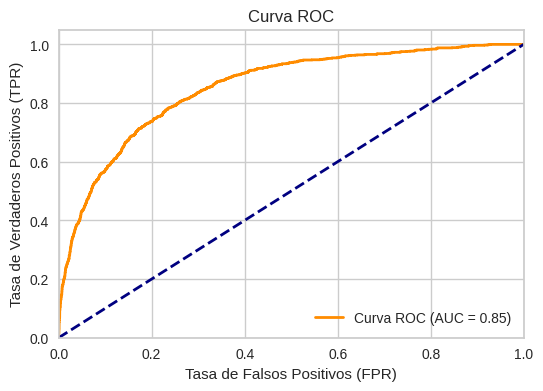

In [ ]:
# Grafico la curva ROC
plt.figure(figsize=(6, 4))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='Curva ROC (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de Falsos Positivos (FPR)')
plt.ylabel('Tasa de Verdaderos Positivos (TPR)')
plt.title('Curva ROC')
plt.legend(loc="lower right")
plt.show()

Entendemos que el mejor umbral es el que tiene la mínima distancia al punto (0,1), lo buscamos:


In [ ]:
#Calcular el índice de Youden (TPR - FPR) para cada umbral
youden_index = tpr - fpr

# Encontrar el índice del mejor umbral
best_threshold_index = youden_index.argmax()

# Obtener el mejor umbral
best_threshold = thresholds[best_threshold_index]

print("El mejor umbral es:", round(best_threshold,2))

El mejor umbral es: 0.46


Otra forma de buscar el valor puntual del umbral:

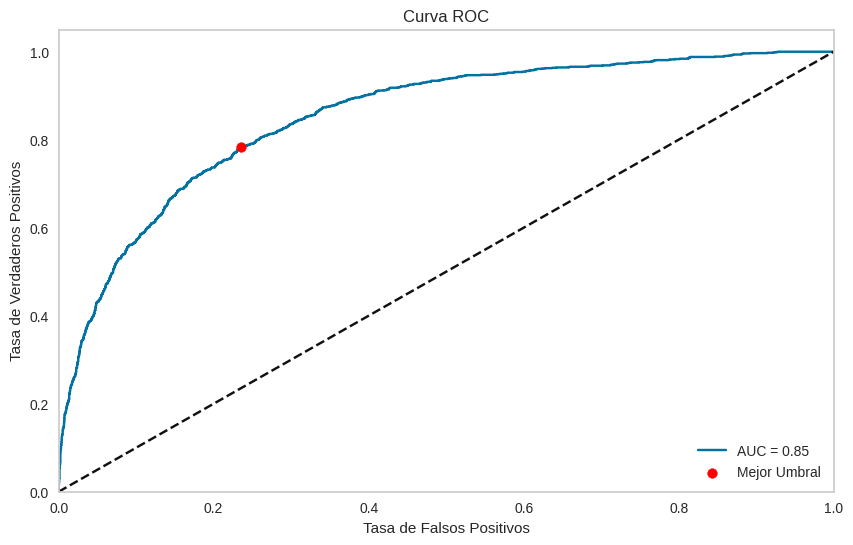

El mejor umbral es: 0.46


In [ ]:
# Calcular el AUC
auc = roc_auc_score(y_test,y_probs)

# Calcular la distancia a (0, 1)
distances = np.sqrt(fpr**2 + (1 - tpr)**2)

# Encontrar el índice
best_index = np.argmin(distances)
best_threshold = thresholds[best_index]

# Graficar la curva ROC
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, label=f'AUC = {auc:.2f}')
plt.scatter(fpr[best_index], tpr[best_index], color='red', label='Mejor Umbral', zorder=5)
plt.plot([0, 1], [0, 1], 'k--')  # Línea diagonal
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Curva ROC')
plt.legend(loc='lower right')
plt.grid()
plt.show()

# Imprimir el mejor umbral
print(f'El mejor umbral es: {best_threshold:.2f}')

Obtuvimos el mismo umbral con ambos métodos, no hubo diferencia

##Modelo Base

In [ ]:
def modelo_base(y_train, l):
    # Calcular la probabilidad de cada clase
    prob_true = y_train.mean()  # Proporción de True
    prob_false = 1 - prob_true   # Proporción de False

    # Generar valores aleatorios basados en las probabilidades
    # np.random.choice elige entre True y False según las probabilidades
    y_pred = np.random.choice([True, False], size=l, p=[prob_true, prob_false])

    # Devolver una serie con el mismo formato que y_train
    return pd.Series(y_pred)

In [ ]:
modelo_base_pred = modelo_base(y_train.squeeze(), len(y_test)) #squeeze para pasar serie en vez de dataframe

###Métricas

In [ ]:
confusion_matrix = confusion_matrix(y_test, modelo_base_pred)

classification_report_model = classification_report(y_test, modelo_base_pred)

# Imprimir métricas
print("Métricas para nuestro modelo:")
print("Matriz de confusión:")
print(confusion_matrix)
print("Reporte de clasificación:")
print(classification_report_model)

Métricas para nuestro modelo:
Matriz de confusión:
[[3568 1065]
 [ 961  297]]
Reporte de clasificación:
              precision    recall  f1-score   support

           0       0.79      0.77      0.78      4633
           1       0.22      0.24      0.23      1258

    accuracy                           0.66      5891
   macro avg       0.50      0.50      0.50      5891
weighted avg       0.67      0.66      0.66      5891



In [ ]:
#Nos guardamos las métricas de f1_score para comparar al final del tp
modelo_base_train = modelo_base(y_train.squeeze(), len(y_train))

# Calcular métricas F1 para train y test
f1_train_base = f1_score(y_train, modelo_base_train, average='weighted')
f1_test_base = f1_score(y_test, modelo_base_pred, average='weighted')

print(f'F1-score en el conjunto de entrenamiento: {f1_train_base:.2f}')
print(f'F1-score en el conjunto de prueba: {f1_test_base:.2f}')

F1-score en el conjunto de entrenamiento: 0.64
F1-score en el conjunto de prueba: 0.66


##Conclusión Parte 1

De la matriz de confusión se puede ver que nuestro modelo tiene 979 falsos positivos y 1076 falsos negativos
La precisión para la clase True (cuando se espera lluvia) es baja (21%), lo que sugiere que el modelo tiene dificultades para identificar correctamente los días de lluvia. El recall para esta clase también es bajo (22%), lo que significa que solo una pequeña proporción de los días lluviosos fue correctamente identificada.

La matriz de confusión revela que hay un alto número de falsos negativos (979): el modelo tiende a predecir incorrectamente días de lluvia como días sin lluvia. Es más efectivo para predecir días sin lluvia (clase False) que para días con lluvia (clase True).

Como conclusión final, este modelo es peor que el de regresión logística basandonos en **UNA SOLA MEDIDA DE COMPARACIÓN** que nosotros decidimos quedarnos con F1 Score: en este hay 78% de clase False y 21% de True, mientras que en el otro es 84% y 58% respectivamente, además de tener un umbral cercano a 0.5 y un AUC de 0.85 (cercano a 1)  

#Parte Dos


##Optimización de hiperparametros

Propuesta de parámetros:

In [ ]:
params = [
    {'penalty': ['l2','l1','elasticnet', None],
    "C": [0.1, 1, 10,100],
    "solver": ['lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky', 'sag', 'saga'],
    "max_iter": [50, 100, 200, 500]}
]

Si bien vimos en el apartado de métricas del modelo de regresión logística que no estaríamos en presencia de sub o sobreajuste con el modelo que probamos, vamos a experimentar incorporando 'penalty' y 'c' para ver si de hecho obtenemos una mejora adicional en la generalización del modelo de RL. También incorporamos 'solver' que está directamente relacionado con 'penalty', y 'max_iter' para saber cuántas iteraciones necesitaría el modelo para converger

Como nos quedó una grilla que tiene muchas combinaciones posibles ( < 256) empezamos probando con random search y evitar una búsqueda exhaustiva con grid search que sabemos nos llevará mucho tiempo. Aprovechamos agregando un valor de cv directamente en esta búsqueda

In [ ]:
#random search
random_search = RandomizedSearchCV(LogisticRegression(class_weight='balanced'),
                                   params,
                                   n_iter=30,
                                   cv=5,
                                   scoring='f1',
                                   n_jobs=-1,
                                   random_state = 42)# n_jobs=-1 si quisieramos mejorar el tiempo de ejecucion
random_search.fit(X_train_scaled, y_train)
best_random_params = random_search.best_params_

In [ ]:
random_search.best_params_

{'solver': 'newton-cholesky', 'penalty': None, 'max_iter': 200, 'C': 10}

In [ ]:
best_random_params = {'solver': 'newton-cholesky', 'penalty': None, 'max_iter': 200, 'C': 10}

In [ ]:
y_pred_rs = random_search.predict(X_test_scaled)
print(classification_report(y_test, y_pred_rs))

              precision    recall  f1-score   support

           0       0.92      0.79      0.85      4633
           1       0.49      0.75      0.59      1258

    accuracy                           0.78      5891
   macro avg       0.71      0.77      0.72      5891
weighted avg       0.83      0.78      0.79      5891



In [ ]:
best_random_model = LogisticRegression(class_weight='balanced', **best_random_params, random_state=42)
# best_random_model = LogisticRegression( **best_random_params, random_state=42)
best_random_model.fit(X_train_scaled, y_train)

LogisticRegression(C=10, class_weight='balanced', max_iter=200, penalty=None,
                   random_state=42, solver='newton-cholesky')

In [ ]:
f1_test_lr_rs = f1_score(y_test, best_random_model.predict(X_test_scaled),average = 'weighted')
f1_train_lr_rs = f1_score(y_train, best_random_model.predict(X_train_scaled),average = 'weighted')
print(f"F1-score del modelo con random search en datos de test: {f1_test_lr_rs}")
print(f"F1-score del modelo con random search en datos de train: {f1_train_lr_rs}")

F1-score del modelo con random search en datos de test: 0.7949970096815077
F1-score del modelo con random search en datos de train: 0.8110078796984486


A modo de experimentación en este TP, probamos con optuna también para ver qué resultados obtenemos utilizando esta técnica más avanzada

In [ ]:
#Split para realizar validación cruzada en optuna
X_train_cv, X_val_cv, y_train_cv, y_val_cv = train_test_split(X_train_scaled, y_train, test_size=0.2, random_state=42)

In [ ]:
#optuna
def train_evaluate_model(params, X_train, y_train, X_val, y_val):
    model = LogisticRegression(class_weight='balanced', **params, random_state=42)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_val)
    f1 = f1_score(y_val, y_pred)
    return f1

def objective(trial):
    # Sugerir un valor para solver
    solver = trial.suggest_categorical('solver', ['lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky', 'sag', 'saga'])

    # Filtrar las opciones de penalty según el solver
    if solver in ['newton-cg', 'newton-cholesky']:
        penalty = trial.suggest_categorical('penalty', ['l2', None])
    elif solver == 'liblinear':
        penalty = trial.suggest_categorical('penalty', ['l1', 'l2'])
    elif solver in ['lbfgs', 'sag']:
        penalty = trial.suggest_categorical('penalty', ['l2'])
    elif solver == 'saga':
        penalty = trial.suggest_categorical('penalty', ['l1', 'l2', 'elasticnet', None])

    # Sugerir valores para C y max_iter
    C = trial.suggest_float('C', 0.1, 1000, log=True)
    max_iter = trial.suggest_int('max_iter', 20, 1000)

    # Construir los parámetros del modelo
    params = {
        'penalty': penalty,
        'C': C,
        'solver': solver,
        'max_iter': max_iter
    }

    # Entrenar y evaluar el modelo
    f1 = train_evaluate_model(params, X_train_cv, y_train_cv, X_val_cv, y_val_cv)
    return f1


study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50)
best_optuna_params = study.best_params
print(f"Best hyperparameters: {best_optuna_params}")

[I 2024-11-28 16:12:13,391] A new study created in memory with name: no-name-c52cb94e-7aed-4e8a-900b-c7f655080343
[I 2024-11-28 16:12:13,769] Trial 0 finished with value: 0.6380611839491458 and parameters: {'solver': 'liblinear', 'penalty': 'l1', 'C': 0.7253659810493327, 'max_iter': 902}. Best is trial 0 with value: 0.6380611839491458.
[W 2024-11-28 16:12:13,771] Trial 1 failed with parameters: {'solver': 'lbfgs'} because of the following error: ValueError('CategoricalDistribution does not support dynamic value space.').
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/optuna/study/_optimize.py", line 197, in _run_trial
    value_or_values = func(trial)
  File "<ipython-input-76-d545c6f781e9>", line 19, in objective
    penalty = trial.suggest_categorical('penalty', ['l2'])
  File "/usr/local/lib/python3.10/dist-packages/optuna/trial/_trial.py", line 402, in suggest_categorical
    return self._suggest(name, CategoricalDistribution(choices=choices))
  

ValueError: CategoricalDistribution does not support dynamic value space.

In [ ]:
best_optuna_params

In [ ]:
#Guardamos el diccionario para quedarnos con las mismas métricas en cada ejecución del tp
best_optuna_params = {'solver': 'liblinear',
 'C': 0.7451841337053782,
 'max_iter': 899,
 'penalty': 'l1'}

In [ ]:
best_optuna_model = LogisticRegression(class_weight='balanced', **best_optuna_params, random_state=42)
best_optuna_model.fit(X_train_scaled, y_train)
y_pred = best_optuna_model.predict(X_test_scaled)

print("\nClassification Report:")
print(classification_report(y_test, y_pred))


Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.79      0.85      4633
           1       0.49      0.75      0.59      1258

    accuracy                           0.78      5891
   macro avg       0.71      0.77      0.72      5891
weighted avg       0.83      0.78      0.79      5891



In [ ]:
f1_test_lr_opt = f1_score(y_test, best_optuna_model.predict(X_test_scaled),average = 'weighted')
f1_train_lr_opt = f1_score(y_train, best_optuna_model.predict(X_train_scaled),average = 'weighted')
print(f"F1-score del modelo con optuna en datos de test: {f1_test_lr_opt:.4f}")
print(f"F1-score del modelo con optuna en datos de train: {f1_train_lr_opt:.4f}")

F1-score del modelo con optuna en datos de test: 0.7942
F1-score del modelo con optuna en datos de train: 0.8107


Vemos que no es superador de RandomSearch. Pareciera que el modelo no mejora más, que ya está trabajando de forma óptima, porque a pesar de haber ampliado los rangos de búsqueda en Optuna simplemente obtuvimos métricas similares (siempre observando f1-score) que RS.

##SHAP

Ahora realizaremos un analisis de explicabilidad del modelo para entender que es lo que evalua a la hora de predecir si un dia llueve o no.

In [ ]:
feature_names = X_train_scaled.columns.values

In [ ]:
explainer = shap.LinearExplainer(best_optuna_model, X_train_scaled, feature_names=feature_names)

###Interpretabilidad **Local**

Vamos a analizar los dias que nuestro modelo predice con mayor probabilidad el valor de RainTomorrow. Buscaremos el índice en donde la probabilidad de que pertenezca a la clase 0(False) sea la mayor y haremos lo mismo para la clase 1(True)

In [ ]:
# Calcula los valores SHAP para un conjunto de prueba
shap_values = explainer.shap_values(X_test_scaled)

In [ ]:
probabilidades = model_lr.predict_proba(X_test_scaled)

In [ ]:
menor_prob_lluvia_idx = np.argmax(probabilidades[:, 0])
menor_prob = model_lr.predict_proba(X_test_scaled)[menor_prob_lluvia_idx]

print(f"Índice del valor mas grande de probabilidad de pertencencia a clase 0: {menor_prob_lluvia_idx}\nSu probabilidad es: {round(menor_prob[0],3)}%")

Índice del valor mas grande de probabilidad de pertencencia a clase 0: 556
Su probabilidad es: 0.997%


In [ ]:
explanation = shap.Explanation(values=shap_values[menor_prob_lluvia_idx],
                               base_values=explainer.expected_value,
                               feature_names=feature_names)

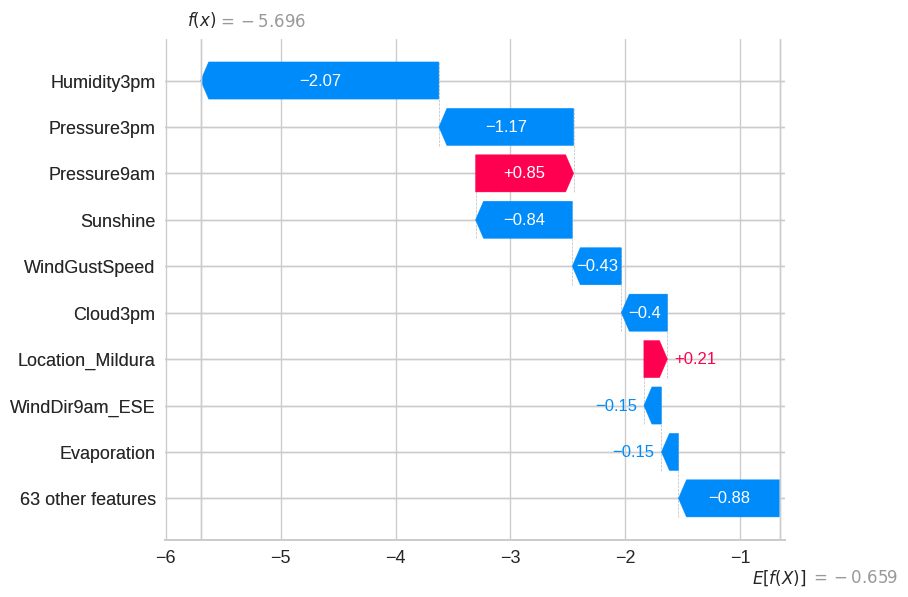

In [ ]:
shap.plots.waterfall(explanation, max_display=10)

De este gráfico podemos analizar el día que nuestro modelo predijo con mas certeza que RainTomorrow tenía valor False. Vemos que para hacer esa predicción le dió mucho peso a la variable Humidity3pm, a ambas variables que miden la presión y a la cantidad de horas de sol.

In [ ]:
#Ahora realizamos lo mismo para el día que asignó con mayor probabilidad de que RainTomorrow sea True
mayor_prob_lluvia_idx = np.argmax(probabilidades[:, 1])
explanation = shap.Explanation(values=shap_values[mayor_prob_lluvia_idx],
                               base_values=explainer.expected_value,
                               feature_names=feature_names)

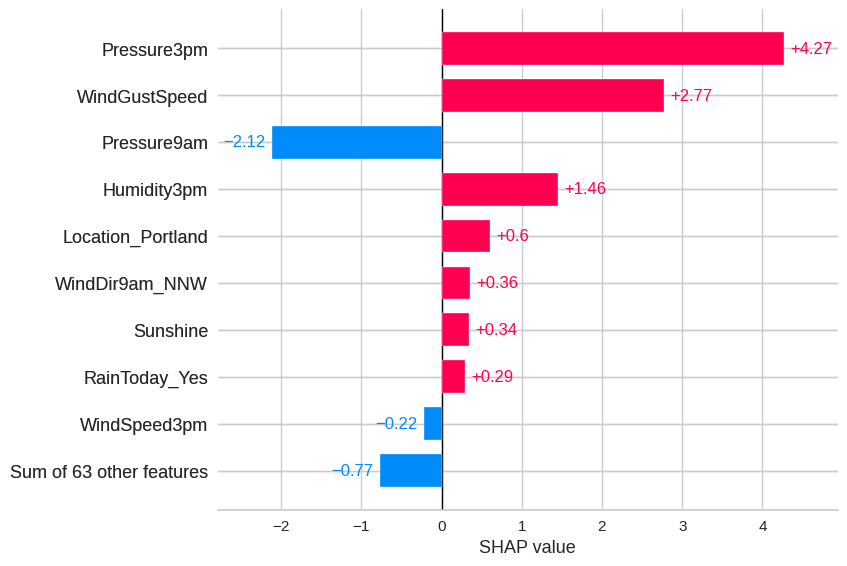

In [ ]:
shap.plots.bar(explanation)

Observando el gráfico podemos distinguir ciertas diferencias con el anterior. Para el caso donde nuestro modelo asignó con mayor certeza que RainTomorrow era True, al igual que antes le dió mucha importancia a las variables de presion y Humidity3pm. Pero, en este caso, le dió considerable importancia a la variable de WindGustSpeed.

###Interpretabilidad **Global**

Ahora veremos que variables nuestro modelo considera más importantes cuando se analiza todo el conjunto de prueba entero.

In [ ]:
global_explanation = shap.Explanation(values=shap_values, base_values=explainer.expected_value, feature_names=feature_names, data=X_test_scaled)

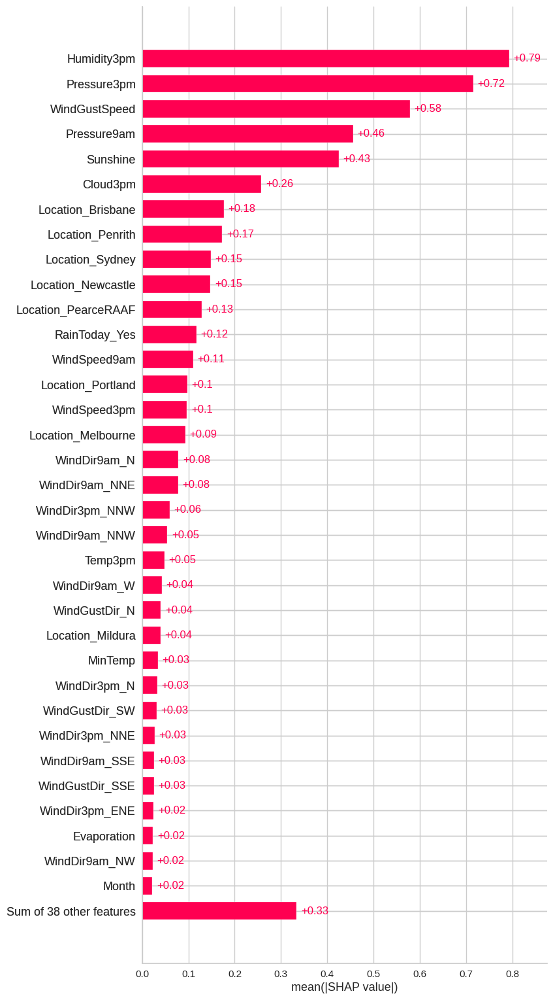

In [ ]:
shap.plots.bar(global_explanation, max_display = 35)

Viendo este gráfico podemos ver que las variables que nuestro modelo considera mas importantes son: Humidity3pm, Pressure3pm, WindGustSpeed, Pressure9am, Sunshine, Cloud3pm.  
Podemos concluir que lo que más afecta cuando consideramos si el día de mañana va a llover es la presion atmosferica, la humedad, la velocidad del viento, la cantidad de horas de sol y la nubosidad, dándole importancia a los valores obtenidos por la tarde (3pm) por sobre la mañana.
Por otra parte podemos ver que las siguientes variables más importantes tienen que ver con las diferentes Locations, lo cual nos puede dar una idea de que diferentes lugares geograficos tienen una variación importante en la cantidad de dias de lluvia.  

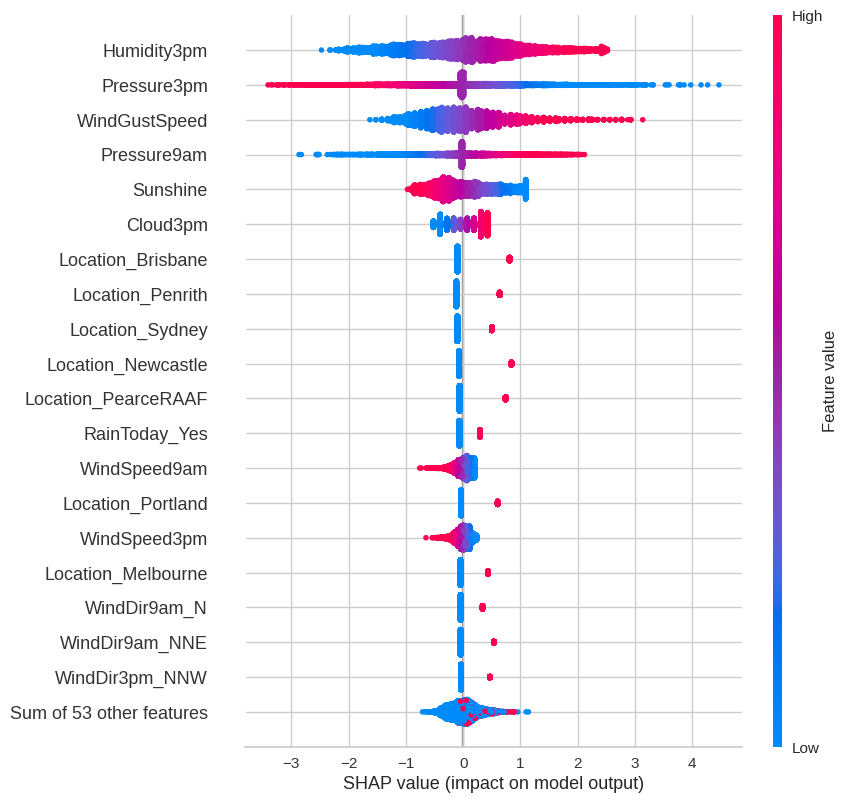

In [ ]:
shap.plots.beeswarm(global_explanation, max_display = 20)

En este grafico de enjambres de abeja podemos observar como afecta el valor de la variable en relación al SHAP value asociado. Para la mayoría de las características anteriores mencionadas, a mayor valor de la variable, mayor SHAP value, por ende, resulta en un aumento de la probabilidad de que llueva al otro día. Sunshine y Pressure3pm se mueven de forma opuesta a esto.

Cuando habiamos hecho el analisis exploratorio, mencionamos que las variables nubosidad, humedad y la cantidad de horas del sol en el día parecian tener alguna relación marcado con la variable objetivo, este analisis explicativo corrobora nuestra teoría inicial, ya que las variables con mayor SHAP value incluyen las mencionadas.

In [ ]:
# Calcula el valor SHAP promedio absoluto para cada característica y muestra las 10 variables con menor valor
mean_shap_values = np.abs(global_explanation.values).mean(axis=0)
shap_val = pd.DataFrame({
    'feature': global_explanation.feature_names,
    'mean_shap_value': mean_shap_values
})
bottom_10 = shap_val.sort_values(by='mean_shap_value').head(10)
print(bottom_10[['feature', 'mean_shap_value']])

            feature  mean_shap_value
39     WindDir3pm_W         0.000000
40   WindDir3pm_WNW         0.000000
56   WindDir9am_WSW         0.000000
58  WindGustDir_ESE         0.000000
69    WindGustDir_W         0.000523
71  WindGustDir_WSW         0.000706
63   WindGustDir_NW         0.001269
53    WindDir9am_SW         0.002048
42   WindDir9am_ENE         0.002656
28   WindDir3pm_ESE         0.002840


Observamos que las variables que menos afectan al modelo son las que se relacionan con la dirección del viento. Esto puede significar que la dirección del viento no afecta demasiado a la prediccion o puede pasar tambien que al ser variables dummys para cada posible dirección, el valor de cada una sea demasiado bajo.

##AutoML


Probamos usando PyCaret

In [ ]:
#Nos habíamos guardado las variables clima_train_aml, X_test_aml y y_test_aml. Las usamos:

#Pasar a df y_test_aml para concatener con X_test_aml:
y_test_aml_df = pd.DataFrame(y_test_aml, columns=['RainTomorrow'])

#reset
X_test_aml.reset_index(drop=True, inplace=True)

#combinamos
clima_test_aml = pd.concat([X_test_aml, y_test_aml_df], axis=1)
#vemos si quedan NaN
clima_test_aml.isna().sum()

,0
Location,0
MinTemp,0
MaxTemp,0
Rainfall,0
Evaporation,0
Sunshine,0
WindGustDir,0
WindGustSpeed,0
WindDir9am,0
WindDir3pm,0


In [ ]:
#los valores nan que estén en la target se borran, como habiamos hecho con y_train. clf no ejecuta si existen nan en estos datos
clima_test_aml.dropna(subset=['RainTomorrow'],inplace=True)

In [ ]:
clf = setup(data=clima_train_aml, target='RainTomorrow', session_id=123, test_data=clima_test_aml, index=False, n_jobs=1)

,Description,Value
0,Session id,123
1,Target,RainTomorrow
2,Target type,Binary
3,Target mapping,"No: 0, Yes: 1"
4,Original data shape,"(28062, 23)"
5,Transformed data shape,"(28062, 77)"
6,Transformed train set shape,"(22455, 77)"
7,Transformed test set shape,"(5607, 77)"
8,Numeric features,17
9,Categorical features,5


In [ ]:
best_model = compare_models() #mejor modelo encontrado.

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.8530,0.8840,0.8530,0.8454,0.8444,0.5434,0.5541,1.0750
gbc,Gradient Boosting Classifier,0.8507,0.8753,0.8507,0.8428,0.8403,0.5289,0.5431,8.6220
xgboost,Extreme Gradient Boosting,0.8502,0.8784,0.8502,0.8424,0.8430,0.5421,0.5494,1.4170
rf,Random Forest Classifier,0.8489,0.8746,0.8489,0.8412,0.8364,0.5148,0.5337,5.7840
et,Extra Trees Classifier,0.8477,0.8779,0.8477,0.8400,0.8343,0.5077,0.5284,5.2340
lda,Linear Discriminant Analysis,0.8449,0.8669,0.8449,0.8364,0.8372,0.5245,0.5320,0.8320
lr,Logistic Regression,0.8440,0.8657,0.8440,0.8349,0.8350,0.5160,0.5258,6.8060
ridge,Ridge Classifier,0.8437,0.8669,0.8437,0.8345,0.8314,0.5007,0.5173,0.7190
ada,Ada Boost Classifier,0.8423,0.8654,0.8423,0.8327,0.8323,0.5069,0.5180,2.4110
knn,K Neighbors Classifier,0.8291,0.8097,0.8291,0.8181,0.8197,0.4718,0.4800,1.6250


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

Se ve que para estos datos un modelo de 'Light Gradient Boosting Machine' es el que mejor métricas tiene

In [ ]:
best_model

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=1, num_leaves=31, objective=None,
               random_state=123, reg_alpha=0.0, reg_lambda=0.0, subsample=1.0,
               subsample_for_bin=200000, subsample_freq=0)

Vemos sus métricas f1:

In [ ]:
evaluate_model(best_model)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [ ]:
# F1 score en el modelo ajustado de manera directa
metricas_automl = pull()
metricas_automl

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Light Gradient Boosting Machine,0.8886,0.9427,0.8886,0.8855,0.8828,0.6571,0.6675


In [ ]:
f1_test_automl = metricas_automl.loc[0, 'F1']
f1_test_automl

0.8828

Se ve que logra promediar un F1 de 0,88, muy parecida a la que obtuvimos nosotros al tunear hiperparámetros (0,85 con Optuna). Podemos constatar que no veníamos por mal camino con todas las decisiones que fuimos tomando a lo largo del TP, al ver que AutoML llega a métricas similares. Es decir, entendemos que estamos obteniendo las mejores predicciones posibles para nuestro dataset, por lo menos con las herramientas que tenemos. Incluso al estar usando LogisticRegression pudimos observar con AutoML que es de los mejores modelos para usar en este problema. Veremos en la parte 3 si con redes neuronales se puede conseguir mejorar la predicción de cuándo llueve, o si definitivamente para los datos que poseemos, estos números son los mejores que podemos obtener

#Parte Tres

##Redes Neuronales

In [ ]:
class NeuralNetwork:
    def __init__(self, epochs=50, batch_size=16, learning_rate=0.01):
        self.epochs = epochs
        self.batch_size = batch_size
        self.learning_rate = learning_rate
        self.model = None

    def build_model(self, input_shape, loss='binary_crossentropy'):
        model = tf.keras.models.Sequential([
            tf.keras.layers.Dense(30, activation='relu', input_shape=(input_shape,)),
            tf.keras.layers.Dense(26, activation='relu'),
            tf.keras.layers.Dense(1, activation='sigmoid')  # Salida binaria
        ])
        optimizer = tf.keras.optimizers.Adam(learning_rate=self.learning_rate)
        model.compile(loss=loss, optimizer=optimizer)
        self.model = model

    def train(self, X_train, y_train, X_valid, y_valid):
        history = self.model.fit(
            X_train, y_train,
            validation_data=(X_valid, y_valid),
            epochs=self.epochs,
            batch_size=self.batch_size
        )
        return history.history

    def evaluate(self, X_test, y_test, X_train, y_train):
        y_pred = self.model.predict(X_test)
        y_pred_train = self.model.predict(X_train)
        y_pred_binary = (y_pred > 0.5).astype(int).flatten()  # Binarizar
        y_pred_train_binary = (y_pred_train > 0.5).astype(int).flatten()
        accuracy = accuracy_score(y_test, y_pred_binary)
        f1_test = f1_score(y_test, y_pred_binary, average='weighted')  # F1 ponderado
        f1_train = f1_score(y_train, y_pred_train_binary, average='weighted')
        print(f"Test F1-Score (weighted): {f1_test:.4f}, Test Accuracy: {accuracy:.4f}")
        return f1_test, f1_train, accuracy

    def predict(self, X_new):
        probabilities = self.model.predict(X_new)
        predictions = (probabilities > 0.5).astype(int).flatten()  # Binarizar
        return predictions

###Adaptación de dataframes

Tenemos que asegurarnos de usar arrays de numpy como entrada para los metodos de nuestra clase NeuralNetwork

In [ ]:
type(X_train_cv), type(y_train_cv), type(X_val_cv), type(y_val_cv), type(X_test_scaled), type(y_test)

(pandas.core.frame.DataFrame,
 pandas.core.frame.DataFrame,
 pandas.core.frame.DataFrame,
 pandas.core.frame.DataFrame,
 pandas.core.frame.DataFrame,
 numpy.ndarray)

In [ ]:
# Convertir DataFrames a NumPy arrays
X_train_nn = X_train_cv.values
y_train_nn = y_train_cv.values.flatten()  # Convertir a vector 1D

X_valid_nn = X_val_cv.values
y_valid_nn = y_val_cv.values.flatten()

X_test_nn = X_test_scaled.values
y_test_nn = y_test.flatten()


In [ ]:
type(X_train_nn), type(y_train_nn), type(X_valid_nn), type(y_valid_nn), type(X_test_nn), type(y_test_nn)

(numpy.ndarray,
 numpy.ndarray,
 numpy.ndarray,
 numpy.ndarray,
 numpy.ndarray,
 numpy.ndarray)

###Creación y entrenamiento

In [ ]:
# Crear y configurar el modelo
nn = NeuralNetwork(epochs=200, batch_size=64, learning_rate=0.05)

# Construir el modelo: input_shape debe ser el número de características en X_train_nn
nn.build_model(input_shape=X_train_nn.shape[1])

# Entrenar el modelo
history = nn.train(X_train_nn, y_train_nn, X_valid_nn, y_valid_nn)

# Evaluar el modelo en el conjunto de prueba
f1_test_nn, f1_train_nn, accuracy_score_test = nn.evaluate(X_test_nn, y_test_nn, X_train_nn, y_train_nn)

Epoch 1/200
281/281 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 0.3994 - val_loss: 0.3738
Epoch 2/200
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3687 - val_loss: 0.3736
Epoch 3/200
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3558 - val_loss: 0.3697
Epoch 4/200
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3471 - val_loss: 0.3570
Epoch 5/200
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3410 - val_loss: 0.3698
Epoch 6/200
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3364 - val_loss: 0.3775
Epoch 7/200
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3270 - val_loss: 0.3884
Epoch 8/200
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3283 - val_loss: 0.3581
Epoch 9/200
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3252 - val_loss: 0.3699
Epoch 10/200
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3172 - val_loss: 0.3673
Epoch 11/200
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3168 - val_loss: 0.3681
Epoch 12/200
281/281 ━━━━━━━━━━━━━━━━━━━━

In [ ]:
f1_test_nn, f1_train_nn

(0.8117768551393771, 0.8830241911943901)

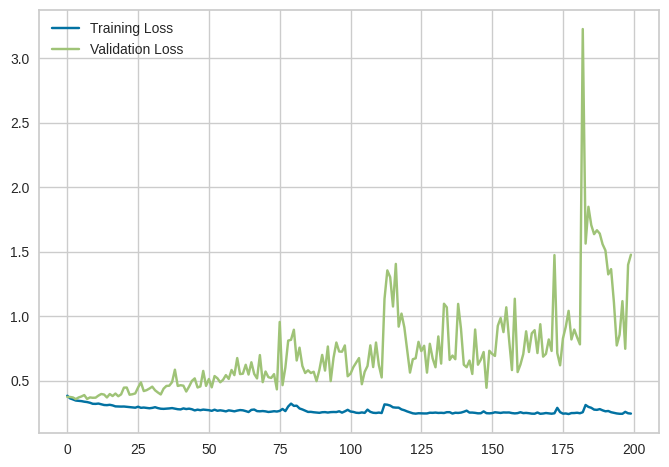

In [ ]:
plt.plot(history['loss'], label='Training Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.legend()
plt.show()

Métricas que nos devuelve el modelo:  
F1 Score (Balanceado) = 0.8215  
Si comparamos esto con los anteriores modelos vemos una mejoría, ya que en regresión logística habíamos obtenido un valor de     
También observamos en la gráfica de training loss y validation loss que a medida que pasan las epocas Validation Loss aumenta a la vez que presenta muchísimo ruido. Esto puede significar varias cosas: que estamos teniendo un problema de sobreajuste y nos ha faltado regularización o drop out, o que hicimos un modelo neuronal muy complejo (quizás una capa menos funcione bien)

###Optimización de Hiperparámetros

Vamos a volver a implementar Optuna, pero agregamos a la clase de NeuralNetwork hiperparámetros relacionados a DropOut para ver si podemos resolver el problema del ruido que obtuvimos, y también sumamos capas y neuronas para encontrar la combinación óptima del conjunto

In [ ]:
#Optuna
def objective(trial):
    # Sugerir hiperparámetros
    epochs = trial.suggest_int('epochs', 10, 200)
    batch_size = trial.suggest_categorical('batch_size', [16, 32, 64, 128])
    learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.6)
    units = trial.suggest_int('units_per_layer', 16, 128)
    num_hidden_layers = trial.suggest_int('num_hidden_layers', 1, 3)
    optimizer_name = trial.suggest_categorical('optimizer', ['adam', 'sgd'])

    # Crear y configurar el modelo
    nn = NeuralNetwork(epochs=epochs, batch_size=batch_size, learning_rate=learning_rate)
    nn.model = tf.keras.models.Sequential()
    nn.model.add(tf.keras.layers.InputLayer(input_shape=(X_train_nn.shape[1],)))

    # Añadir capas ocultas dinámicamente
    for _ in range(num_hidden_layers):
        nn.model.add(tf.keras.layers.Dense(units, activation='relu'))
        nn.model.add(tf.keras.layers.Dropout(dropout_rate))

    # Capa de salida
    nn.model.add(tf.keras.layers.Dense(1, activation='sigmoid'))

    # Configurar optimizador
    if optimizer_name == 'adam':
        optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)
    elif optimizer_name == 'sgd':
        optimizer = tf.keras.optimizers.SGD(learning_rate=learning_rate)

    nn.model.compile(optimizer=optimizer, loss='binary_crossentropy')

    # Entrenar modelo
    history = nn.train(X_train_nn, y_train_nn, X_valid_nn, y_valid_nn)

    # Evaluar con F1-score
    y_pred_binary = (nn.predict(X_valid_nn) > 0.5).astype(int)
    f1 = f1_score(y_valid_nn, y_pred_binary, average='weighted')
    return f1

# Estudio de Optuna
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50)

# Resultados
print("Best hyperparameters:", study.best_params)

[I 2024-11-29 12:11:07,540] A new study created in memory with name: no-name-05ab49ed-80aa-4358-8754-594e00bdcc8a


Epoch 1/200
1123/1123 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.6844 - val_loss: 0.5755
Epoch 2/200
1123/1123 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.5974 - val_loss: 0.5180
Epoch 3/200
1123/1123 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.5362 - val_loss: 0.4891
Epoch 4/200


[W 2024-11-29 12:11:18,667] Trial 0 failed with parameters: {'epochs': 200, 'batch_size': 16, 'learning_rate': 0.0005391185407898698, 'dropout_rate': 0.30452390574305244, 'units_per_layer': 105, 'num_hidden_layers': 3, 'optimizer': 'sgd'} because of the following error: KeyboardInterrupt().
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/optuna/study/_optimize.py", line 197, in _run_trial
    value_or_values = func(trial)
  File "<ipython-input-34-4a400deb3313>", line 34, in objective
    history = nn.train(X_train_nn, y_train_nn, X_valid_nn, y_valid_nn)
  File "<ipython-input-29-0e58c21fc393>", line 19, in train
    history = self.model.fit(
  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler
    return fn(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/trainer.py", line 319, in fit
    callbacks.on_train_batch_begin(step)
  File "/usr/local/lib/

KeyboardInterrupt: 

De nuestro estudio hecho con optuna encontramos que el la mejor métrica fue 0.8496 para el F1-Score en los datos de validación. Ahora probaremos en los de test.

In [ ]:
best_nn_params = study.best_params
best_nn_params

{'epochs': 81,
 'batch_size': 64,
 'learning_rate': 0.0010249981568564751,
 'dropout_rate': 0.2454594066733476,
 'units_per_layer': 116,
 'num_hidden_layers': 1,
 'optimizer': 'adam'}

In [ ]:
best_nn_params = {'epochs': 81,
 'batch_size': 64,
 'learning_rate': 0.0010249981568564751,
 'dropout_rate': 0.2454594066733476,
 'units_per_layer': 116,
 'num_hidden_layers': 1,
 'optimizer': 'adam'} #guardamos para otras sesiones de ejecución

Vemos métrica f1 segun estos parámetros optimizados. Creamos el modelo con ellos:

In [ ]:
# Extraer valores óptimos
epochs = best_nn_params['epochs']
batch_size = best_nn_params['batch_size']
learning_rate = best_nn_params['learning_rate']
dropout_rate = best_nn_params['dropout_rate']
units = best_nn_params.get('units_per_layer', 64)  # Valor predeterminado
num_hidden_layers = best_nn_params.get('num_hidden_layers', 2)
optimizer_name = best_nn_params.get('optimizer', 'adam')

# Configurar el modelo final
final_model = tf.keras.models.Sequential()
final_model.add(tf.keras.layers.InputLayer(input_shape=(X_train_nn.shape[1],)))

# Añadir capas ocultas con los parámetros óptimos
for _ in range(num_hidden_layers):
    final_model.add(tf.keras.layers.Dense(units, activation='relu'))
    final_model.add(tf.keras.layers.Dropout(dropout_rate))

# Capa de salida
final_model.add(tf.keras.layers.Dense(1, activation='sigmoid'))

# Configurar optimizador
if optimizer_name == 'adam':
    optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)
else:
    optimizer = tf.keras.optimizers.SGD(learning_rate=learning_rate)

final_model.compile(optimizer=optimizer, loss='binary_crossentropy')

In [ ]:
# Entrenar el modelo final
history_final = final_model.fit(
    X_train_nn, y_train_nn,
    validation_data=(X_valid_nn, y_valid_nn),
    epochs=epochs,
    batch_size=batch_size,
    verbose=1
)

Epoch 1/81
281/281 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 0.4825 - val_loss: 0.3669
Epoch 2/81
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.3704 - val_loss: 0.3608
Epoch 3/81
281/281 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.3555 - val_loss: 0.3620
Epoch 4/81
281/281 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.3522 - val_loss: 0.3539
Epoch 5/81
281/281 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 0.3389 - val_loss: 0.3479
Epoch 6/81
281/281 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 0.3368 - val_loss: 0.3526
Epoch 7/81
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3419 - val_loss: 0.3482
Epoch 8/81
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3312 - val_loss: 0.3451
Epoch 9/81
281/281 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.3238 - val_loss: 0.3464
Epoch 10/81
281/281 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.3282 - val_loss: 0.3441
Epoch 11/81
281/281 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.3166 - val_loss: 0.3466
Epoch 12/81
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/ste

In [ ]:
# Evaluar en el conjunto de prueba
test_loss = final_model.evaluate(X_test_nn, y_test_nn, verbose=1)

# Obtener el F1-score en el conjunto de prueba
y_pred_test = (final_model.predict(X_test_nn) > 0.5).astype(int)
f1_test_nn_tuned = f1_score(y_test_nn, y_pred_test, average='weighted')
y_pred_train = (final_model.predict(X_train_nn) > 0.5).astype(int)
f1_train_nn_tuned = f1_score(y_train_nn, y_pred_train, average='weighted')

print(f"Test F1-Score (weighted): {f1_test_nn_tuned:.4f}")
print(f"Train F1-Score (weighted): {f1_train_nn_tuned:.4f}")

185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2953 - loss: 0.8069
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
562/562 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
Test F1-Score (weighted): 0.3451
Train F1-Score (weighted): 0.3464


Vemos que en los datos de test nuestra metrica F1-Score empeoró con respecto a lo que habiamos visto en el entrenamiento. Esto se puede explicar si el modelo todavia sobreajusta o tiene mucha complejidad. Para eso veremos el grafico de la evolución del error en training y en validacion.

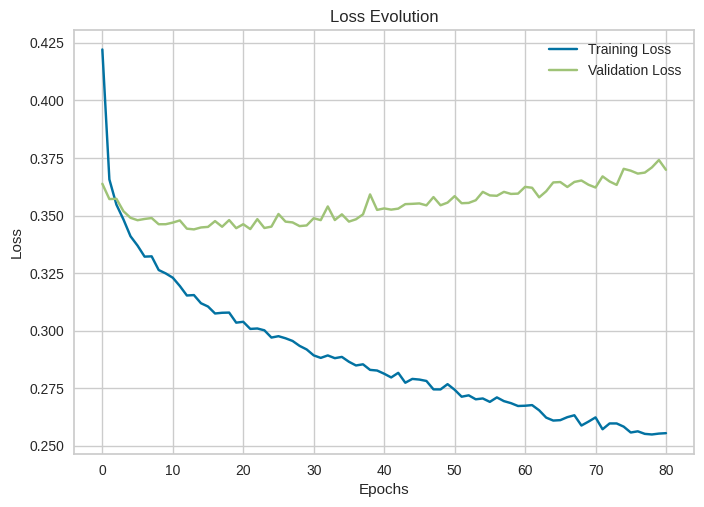

In [ ]:
# Pérdida (Loss)
plt.plot(history_final.history['loss'], label='Training Loss')
plt.plot(history_final.history['val_loss'], label='Validation Loss')
plt.legend()
plt.title('Loss Evolution')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.show()

En efecto si observamos el gráfico pareciera que por más que el error de entrenamiento mejora epoca a epoca, el error de validación empeora ligeramente, intentaremos añadir regularización manualmente para ver como afecta a nuestros resultados.

In [ ]:
# Valor fijo para la regularización L2
l2_lambda = 0.002

# Configurar modelo con regularización L2
l2_model = tf.keras.models.Sequential()
l2_model.add(tf.keras.layers.InputLayer(input_shape=(X_train_nn.shape[1],)))

# Añadir capas ocultas con regularización L2
for _ in range(num_hidden_layers):
    l2_model.add(tf.keras.layers.Dense(
        units,
        activation='relu',
        kernel_regularizer=l2(l2_lambda)  # Aplicar regularización L2
    ))
    l2_model.add(tf.keras.layers.Dropout(dropout_rate))

# Capa de salida con L2
l2_model.add(tf.keras.layers.Dense(
    1,
    activation='sigmoid',
    kernel_regularizer=l2(l2_lambda)  # Aplicar regularización L2 también acá
))

# Configurar optimizador
if optimizer_name == 'adam':
    optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)
else:
    optimizer = tf.keras.optimizers.SGD(learning_rate=learning_rate)

l2_model.compile(optimizer=optimizer, loss='binary_crossentropy')

# Entrenar el modelo con regularización L2
history_l2 = l2_model.fit(
    X_train_nn, y_train_nn,
    validation_data=(X_valid_nn, y_valid_nn),
    epochs=epochs,
    batch_size=batch_size
)

# Evaluar el modelo con regularización L2
l2_test_loss = l2_model.evaluate(X_test_nn, y_test_nn, verbose=1)

# Obtener el F1-score en el conjunto de prueba
y_pred_l2_test = (l2_model.predict(X_test_nn) > 0.5).astype(int)
f1_test_nn_l2 = f1_score(y_test_nn, y_pred_l2_test, average='weighted')
y_pred_l2_train = (l2_model.predict(X_train_nn) > 0.5).astype(int)
f1_train_nn_l2 = f1_score(y_train_nn, y_pred_l2_train, average='weighted')

In [ ]:
print(f"Modelo con L2 - Test F1-Score (weighted): {f1_test_nn_l2:.4f}")
print(f"Modelo con L2 - Train F1-Score (weighted): {f1_train_nn_l2:.4f}")

Modelo con L2 - Test F1-Score (weighted): 0.8325
Modelo con L2 - Train F1-Score (weighted): 0.8448


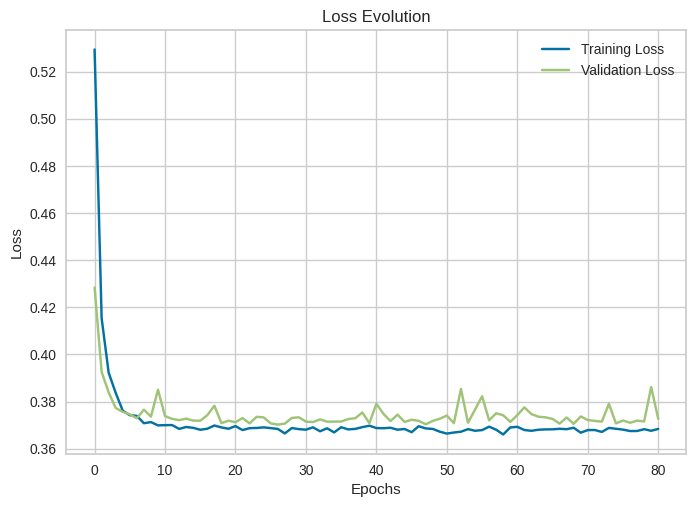

In [ ]:
# Pérdida (Loss)
plt.plot(history_l2.history['loss'], label='Training Loss')
plt.plot(history_l2.history['val_loss'], label='Validation Loss')
plt.legend()
plt.title('Loss Evolution')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.show()

Podemos observar que despues de agregar la regularización L2 ya no se observa un sobreajuste en el modelo, de todas formas no conseguimos una mejora notable en el conjunto de test en comparación a los otros modelos como el realizado en AutoML. Por lo que hemos testeado, no pareciera posible conseguir mejores resultados significativos.

###SHAP

Volvemos a realizar un análisis de explicabilidad pero ahora del modelo neuronal

In [ ]:
feature_names = X_train_cv.columns.values

array(['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am',
       'Cloud3pm', 'Temp9am', 'Temp3pm', 'Month', 'Location_Brisbane',
       'Location_Melbourne', 'Location_Mildura', 'Location_Newcastle',
       'Location_Nhil', 'Location_PearceRAAF', 'Location_Penrith',
       'Location_Portland', 'Location_Sydney', 'RainToday_Yes',
       'WindDir3pm_ENE', 'WindDir3pm_ESE', 'WindDir3pm_N',
       'WindDir3pm_NE', 'WindDir3pm_NNE', 'WindDir3pm_NNW',
       'WindDir3pm_NW', 'WindDir3pm_S', 'WindDir3pm_SE', 'WindDir3pm_SSE',
       'WindDir3pm_SSW', 'WindDir3pm_SW', 'WindDir3pm_W',
       'WindDir3pm_WNW', 'WindDir3pm_WSW', 'WindDir9am_ENE',
       'WindDir9am_ESE', 'WindDir9am_N', 'WindDir9am_NE',
       'WindDir9am_NNE', 'WindDir9am_NNW', 'WindDir9am_NW',
       'WindDir9am_S', 'WindDir9am_SE', 'WindDir9am_SSE',
       'WindDir9am_SSW', 'WindDir9a

In [ ]:
# Inicializar el explainer
explainer = shap.DeepExplainer(l2_model, X_train_nn)

shap_values = explainer.shap_values(X_test_nn)

In [ ]:
shap_values = np.squeeze(shap_values)

In [ ]:
probabilidades = l2_model.predict(X_test_nn)

185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


####Interpretabilidad **Local**

Vamos a analizar los dias que nuestro modelo predice con mayor probabilidad el valor de RainTomorrow. Buscaremos el índice en donde la probabilidad de que pertenezca a la clase 0(False) sea la mayor y haremos lo mismo para la clase 1(True)

In [ ]:
menor_prob_lluvia_idx = np.argmax(probabilidades[:, 0])
menor_prob = probabilidades[menor_prob_lluvia_idx]

print(f"Índice del valor mas grande de probabilidad de pertencencia a clase 0: {menor_prob_lluvia_idx}\nSu probabilidad es: {round(menor_prob[0],3)}%")

Índice del valor mas grande de probabilidad de pertencencia a clase 0: 139
Su probabilidad es: 0.9779999852180481%


In [ ]:
# Crear la explicación directamente con el valor extraído
explanation = shap.Explanation(
    values=shap_values[menor_prob_lluvia_idx],
    base_values=np.array(explainer.expected_value)[0],
    feature_names=feature_names
)

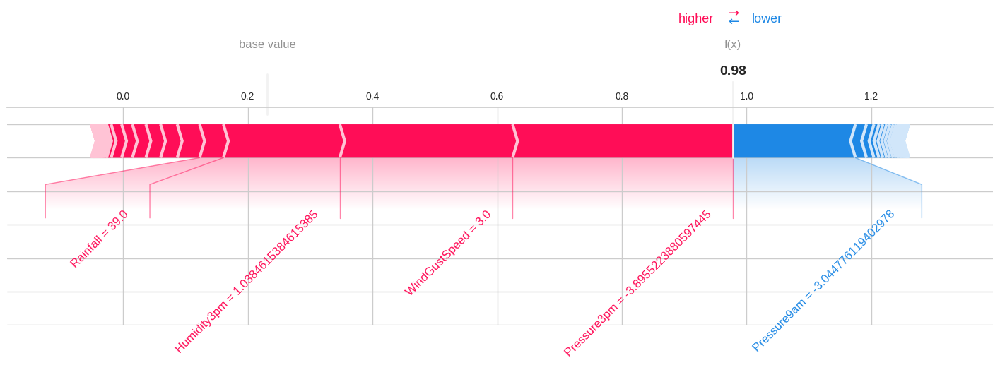

In [ ]:
#inicializar javascript
shap.initjs()

shap.force_plot(np.array(explainer.expected_value)[0], shap_values[menor_prob_lluvia_idx], X_test_nn[menor_prob_lluvia_idx], feature_names = feature_names, matplotlib=True, figsize=(18, 4), text_rotation=45)

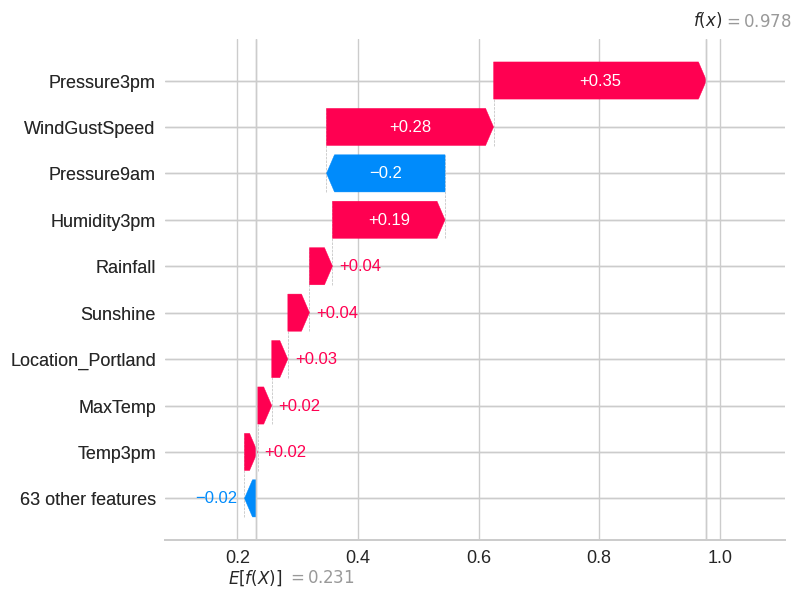

In [ ]:
#waterfall
shap.plots.waterfall(explanation, max_display=10)

De este gráfico podemos analizar el día que nuestro modelo predijo con mas certeza que RainTomorrow tenía valor False. Si lo comparamos con la última vez que usamos shap, se ve que para hacer la predicción le dio mucho peso en general a las mismas variables: presión y humedad, sin embardo Humidity3Pm cayó 3 lugares en este modelo y fue más relevante la presión en conjunto con la velocidad del viento

In [ ]:
#Ahora realizamos lo mismo para el día que asignó con mayor probabilidad de que RainTomorrow sea True
mayor_prob_lluvia_idx = np.argmin(probabilidades[:, 0])

explanation = shap.Explanation(values=shap_values[mayor_prob_lluvia_idx],
                               base_values=np.array(explainer.expected_value)[0],
                               feature_names=feature_names)

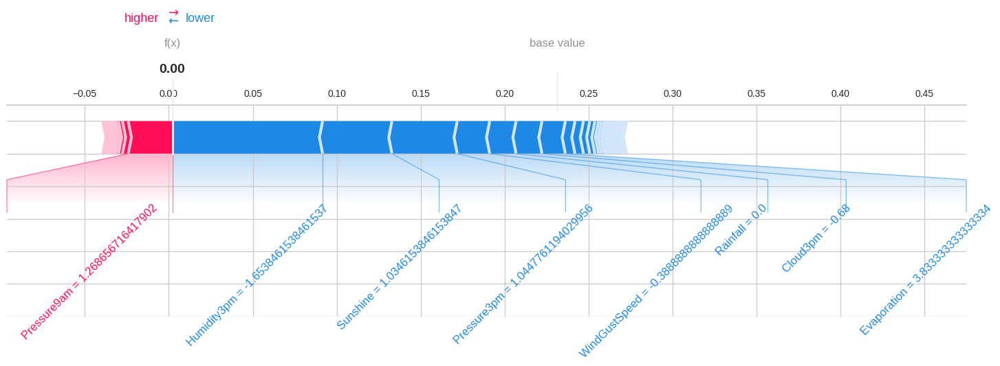

In [ ]:
#inicializar javascript
shap.initjs()
shap.force_plot(np.array(explainer.expected_value)[0], shap_values[mayor_prob_lluvia_idx], X_test_nn[mayor_prob_lluvia_idx], feature_names = feature_names, matplotlib=True, figsize=(18, 4), text_rotation=45)

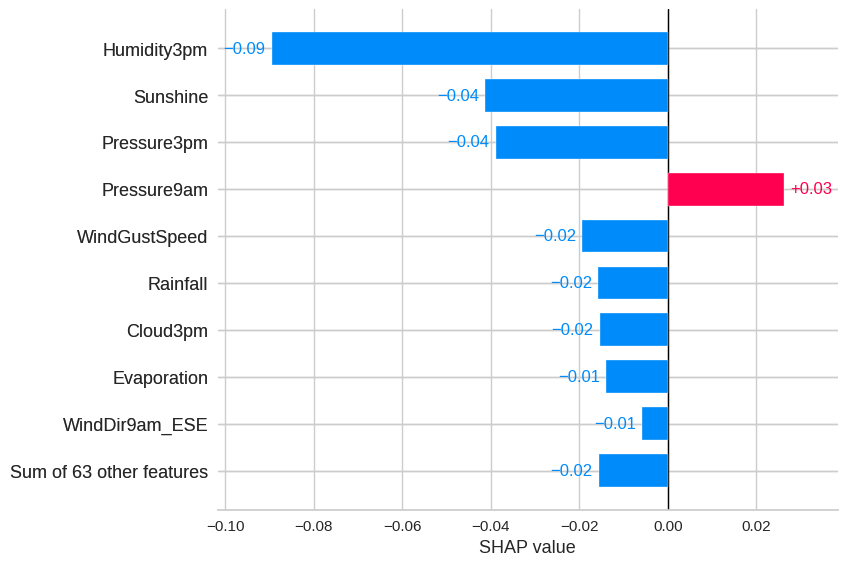

In [ ]:
shap.plots.bar(explanation)

Para el caso donde nuestro modelo asignó con mayor certeza que RainTomorrow es True, al igual que antes le dió mucha importancia a las variables de presion y humedad, con humedad siendo la más importante para saber si al otro día llueve. La velocidad del viento bajó varios lugares. Algo que esperábamos era que la feature Month estuviese más arriba, sobre todo para predecir cuándo sí es más probable de que llueva mañana.

####Interpretabilidad **Global**

Ahora veremos que variables nuestro modelo considera más importantes cuando se analiza todo el conjunto de prueba entero.

In [ ]:
global_explanation = shap.Explanation(values=shap_values,
                                      base_values=np.array(explainer.expected_value)[0],
                                      feature_names=feature_names,
                                      data=X_test_nn)

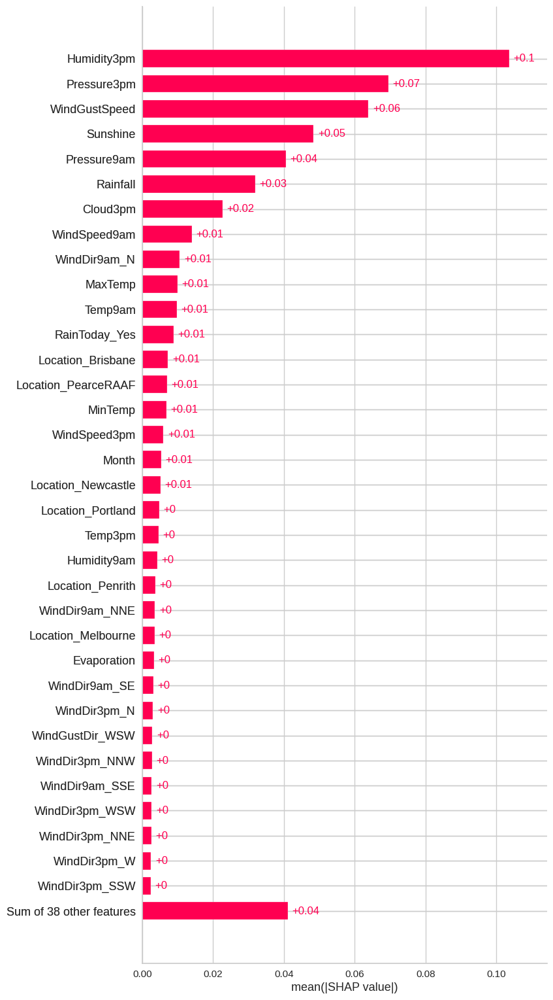

In [ ]:
shap.plots.bar(global_explanation, max_display = 35)

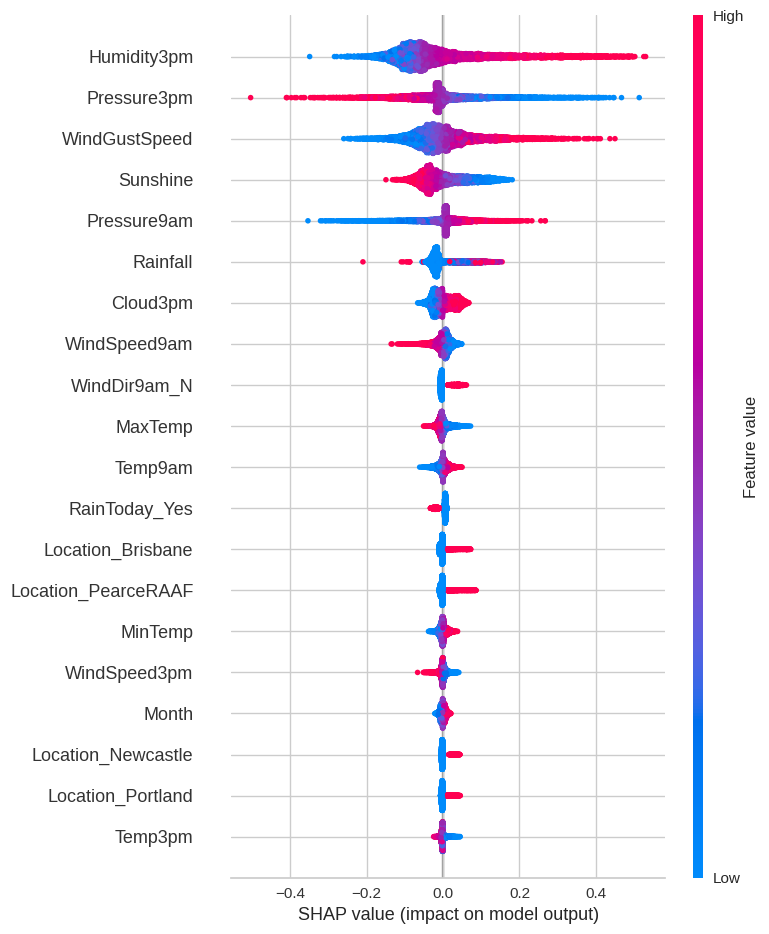

In [ ]:
shap.summary_plot(shap_values, X_test_nn, feature_names=feature_names)

Finalmente, las variables que nuestro modelo considera mas importantes son: Humidity3pm, Pressure3pm, WindGustSpeed,  Sunshine, Pressure9am. Este 'TOP 5' coincide con el que obtuvimos anteriormente, pero priorizó sunshine por sobre la presión medida a la mañana.
Por lo tanto llegamos a las mismas conclusiones que antes. Este modelo y el optimizado con optuna son unos de los mejores que obtuvimos y se ve que coinciden en la forma de ponderar las features
En este caso las locations quedaron bastante abajo, y algo llamativo es que la dirección del viento (WindDir9am_N) subió bastantes lugares en este modelo, cuando en el anterior este tipo de feature era de poca importancia relativa

In [ ]:
# Calcula el valor SHAP promedio absoluto para cada característica y muestra las 10 variables con menor valor
mean_shap_values = np.abs(global_explanation.values).mean(axis=0)
shap_val = pd.DataFrame({
    'feature': global_explanation.feature_names,
    'mean_shap_value': mean_shap_values
})
bottom_10 = shap_val.sort_values(by='mean_shap_value').head(10)
print(bottom_10[['feature', 'mean_shap_value']])

            feature  mean_shap_value
58  WindGustDir_ESE         0.000202
64    WindGustDir_S         0.000247
70  WindGustDir_WNW         0.000286
40   WindDir3pm_WNW         0.000310
63   WindGustDir_NW         0.000328
55   WindDir9am_WNW         0.000339
69    WindGustDir_W         0.000375
42   WindDir9am_ENE         0.000398
27   WindDir3pm_ENE         0.000470
67  WindGustDir_SSW         0.000518


Como antes, las variables que menos afectan al modelo son las que se relacionan con la dirección del viento, por eso nos es llamativo que la dirección norte no esté incluida aquí.

#Comparación de Modelos y Conclusiones

In [ ]:
#Construimos tabla con todos los modelos vistos y columnas de f1_test y f1_train obtenidas en cada uno
modelos = ['Regresión Logística', 'Modelo Base', 'RL Random Search','RL Optuna','AutoML','Redes Neuronales', 'Redes Neuronales Optuna', 'Redes Neuronales L2']
F1_test = [f1_test_lr, f1_test_base, f1_test_lr_rs, f1_test_lr_opt, f1_test_automl, f1_test_nn, f1_test_nn_tuned, f1_test_nn_l2]
F1_train = [f1_train_lr, f1_train_base, f1_train_lr_rs, f1_train_lr_opt,'-', f1_train_nn, f1_train_nn_tuned, f1_train_nn_l2]
comparacion_modelos = pd.DataFrame()
comparacion_modelos['Modelo'] = modelos
comparacion_modelos['F1_Test'] = F1_test
comparacion_modelos['F1_Train'] = F1_train


comparacion_modelos

,Modelo,F1_Test,F1_Train
0,Regresión Logística,0.794245,0.810754
1,Modelo Base,0.662786,0.644609
2,RL Random Search,0.794997,0.811008
3,RL Optuna,0.794154,0.810743
4,AutoML,0.882800,-
5,Redes Neuronales,0.821959,0.891858
6,Redes Neuronales Optuna,0.345115,0.346394
7,Redes Neuronales L2,0.834567,0.844775


- Regresión Logística tiene un buen rendimiento, y como la diferencia entre los datos de train y test no es grande, indica que el modelo está bien ajustado.

- RL Random Search y RL Optuna tienen un rendimiento similar, y aunque fueron modelos optimizados, no mejoraron significativamente sobre la regresión logística. La regresión logística ya estaba bien planteada y evidentemente no hacían falta estas optimizaciones

- Aunque no pudimos obtener F1_train para Light Gradient Boosting Machine	(modelo obtenido de AutoML), es el que más destaca en cuanto a resultados. Sumando que fue rápido de ejecutar y estructurar

- Redes Neuronales aunque no haya podido alcanzar en los datos de test a Light Gradient Boosting Machine, fue muy bueno y superó los resultados de la RL.

- En Redes Neuronales Optuna se nota que la búsqueda de hiperparámetros no fue efectiva, hacía falta la regularización con L2 que logró un valor de 0.834, mejorando mucho el modelo

- El Modelo Base, para nuestros objetivos, no es competitivo comparado con el resto

Finalmente se nota que los mejores 3 modelos para realizar predicciones de clasificación en este trabajo fueron:

1.   Light Gradient Boosting Machine
2.   Redes Neuronales
3.   Regresión Logística

Sería interesante indagar sobre el modelo que nos presentó AutoML y ver si se puede seguir mejorando al aplicar más optimizaciones o probar nuevas técnicas. Sin embargo, en base a estas métricas que hemos conseguido y que en general rondan el 0.8, podemos decir con bastante confianza que hemos llegado a un tope con este dataset, y que si mejora no lo hará mucho más. Además son resultados que nos satisfacen porque valores que ronden el 0.8 en F1 score nos parece bastante alto.




